In [101]:
import numpy as np
import matplotlib
from scipy.signal import find_peaks
import scipy.signal as sig
import matplotlib.pyplot as plt
# import pandas as pd
from astropy.io import fits
import os, fnmatch
from os import listdir
# %matplotlib inline
%matplotlib notebook
# import scipy.signal as sig
import matplotlib.patches as patches
from numpy import loadtxt

In [76]:
h=6.62607004e-34 #Planck constant [m^2 kg / s]
m=1.674927471e-27 #Neutron mass [kg]
t0=0.0
L= 34.8 #[m]
dL = 0

In [77]:
def tof2l(tof):
    l=h/m*(tof-t0)/(L+dL)/1e-10   #l is the wavelength in Angstrom
    return l

def l2tof(l):
    tof=t0+(l*1e-10)*(L+dL)*m/h
    return tof

In [78]:
myTOF = np.genfromtxt('/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/Batt_475_Spectra.txt', usecols=0)
pathOB = "/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/radiographs/OB1/"
rootdir1="/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/S1_bin/"
rootdir4="/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/S4_bin/"
rootdir6="/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/S6_bin/"
myfiles1 = fnmatch.filter(listdir(rootdir1),'#*')
myfiles4 = fnmatch.filter(listdir(rootdir4),'#*')
myfiles6 = fnmatch.filter(listdir(rootdir6),'#*')
print(myfiles1)
print(len(myfiles1))
# print(myfiles1[35])

print(myfiles4)
print(len(myfiles4))

print(myfiles6)
print(len(myfiles6))

['#13_bin_python', '#14_bin_python', '#15_bin_python', '#16_bin_python', '#17_bin_python', '#18_bin_python', '#19_bin_python', '#20_bin_python', '#21_bin_python', '#22_bin_python', '#23_bin_python', '#24_bin_python', '#25_bin_python', '#26_bin_python', '#27_bin_python', '#28_bin_python', '#29_bin_python', '#30_bin_python', '#31_bin_python', '#32_bin_python', '#33_bin_python', '#34_bin_python', '#35_bin_python', '#36_bin_python', '#37_bin_python', '#38_bin_python', '#39_bin_python', '#40_bin_python', '#41_bin_python', '#42_bin_python', '#43_bin_python', '#44_bin_python', '#45_bin_python', '#46_bin_python', '#47_bin_python', '#48_bin_python', '#49_bin_python', '#50_bin_python', '#51_bin_python', '#52_bin_python', '#53_bin_python', '#54_bin_python', '#55_bin_python', '#56_bin_python', '#57_bin_python', '#58_bin_python', '#59_bin_python']
47
['#100_bin_python', '#101_bin_python', '#102_bin_python', '#103_bin_python', '#104_bin_python', '#105_bin_python', '#106_bin_python', '#107_bin_python

In [79]:
mylambda=tof2l(myTOF)

In [80]:
for i in range(0, len(myfiles1)):
    pathdata1= rootdir1+ myfiles1[i]+"/"
    coll_files1=sorted(fnmatch.filter(listdir(pathdata1),'*.fits'))
print(pathdata1)

/Oct-Japan/563_SENJU_Oct2018_Robin/bin_test/tomography/S1_bin/#59_bin_python/


#13_bin_python


<IPython.core.display.Javascript object>


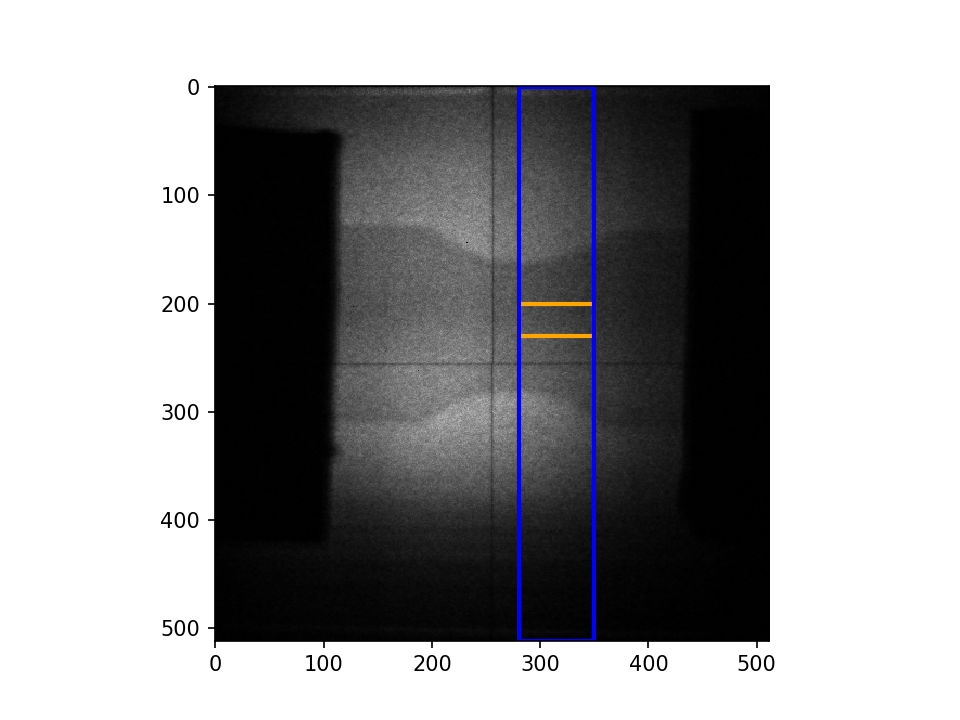

#14_bin_python


<IPython.core.display.Javascript object>


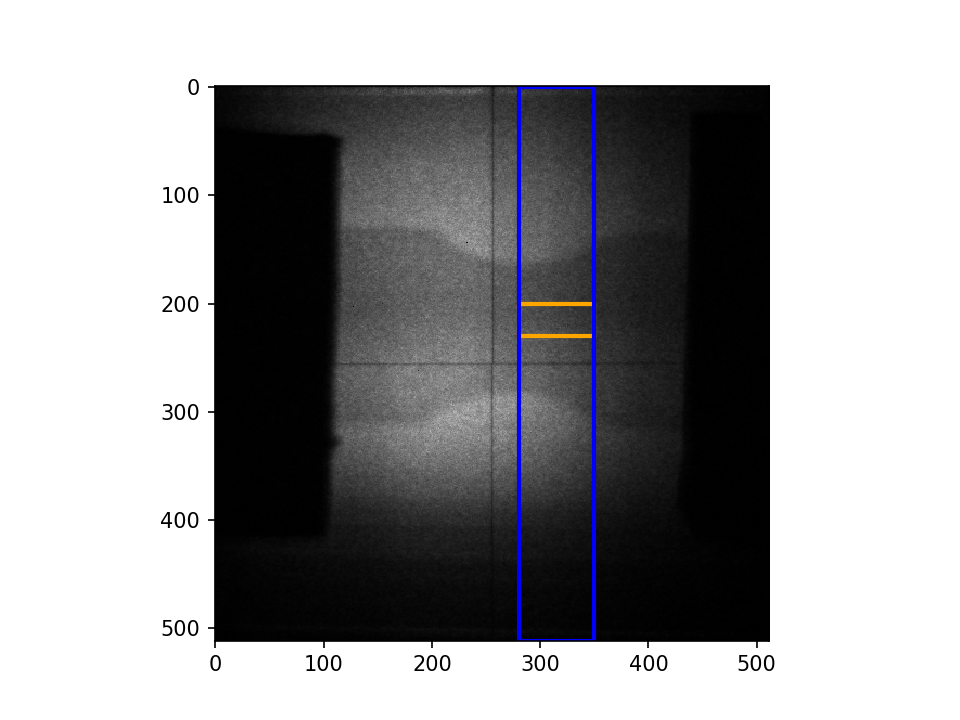

#15_bin_python


<IPython.core.display.Javascript object>


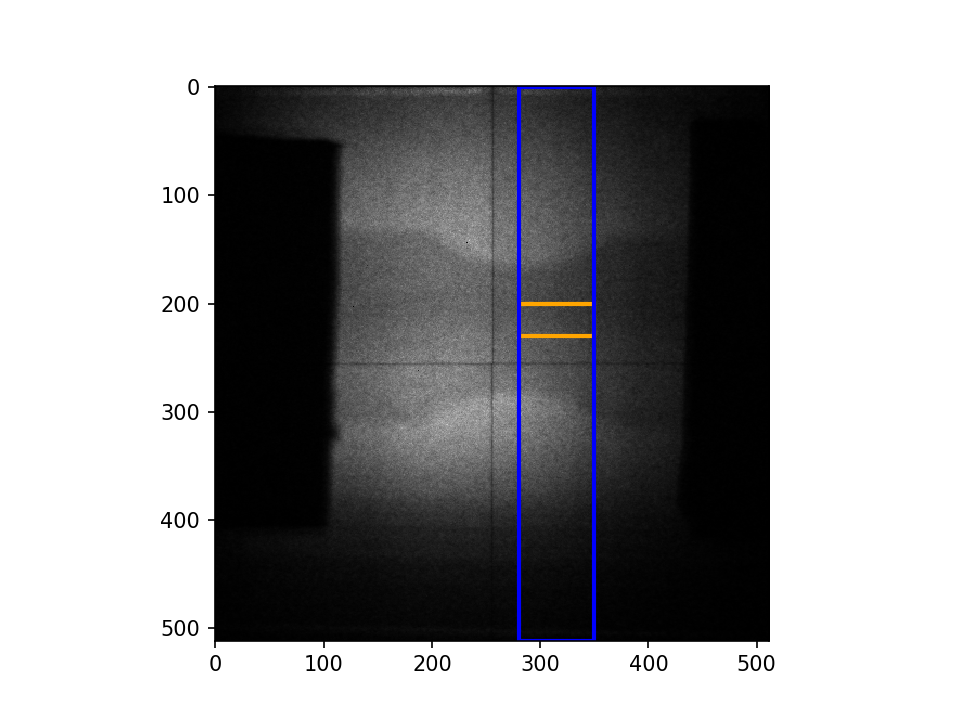

#16_bin_python


<IPython.core.display.Javascript object>


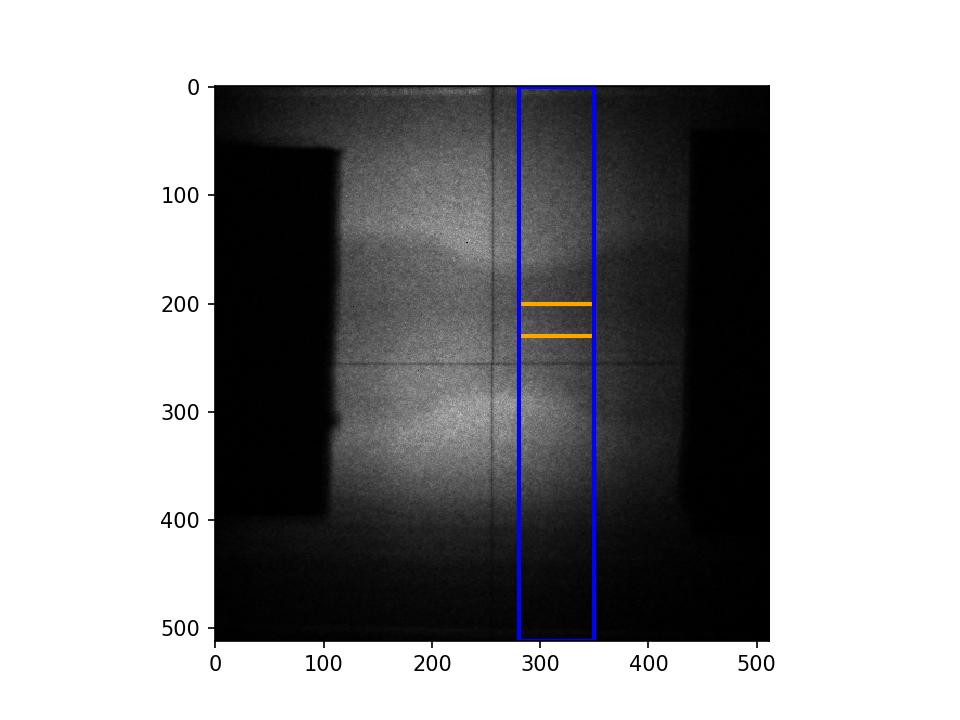

#17_bin_python


<IPython.core.display.Javascript object>


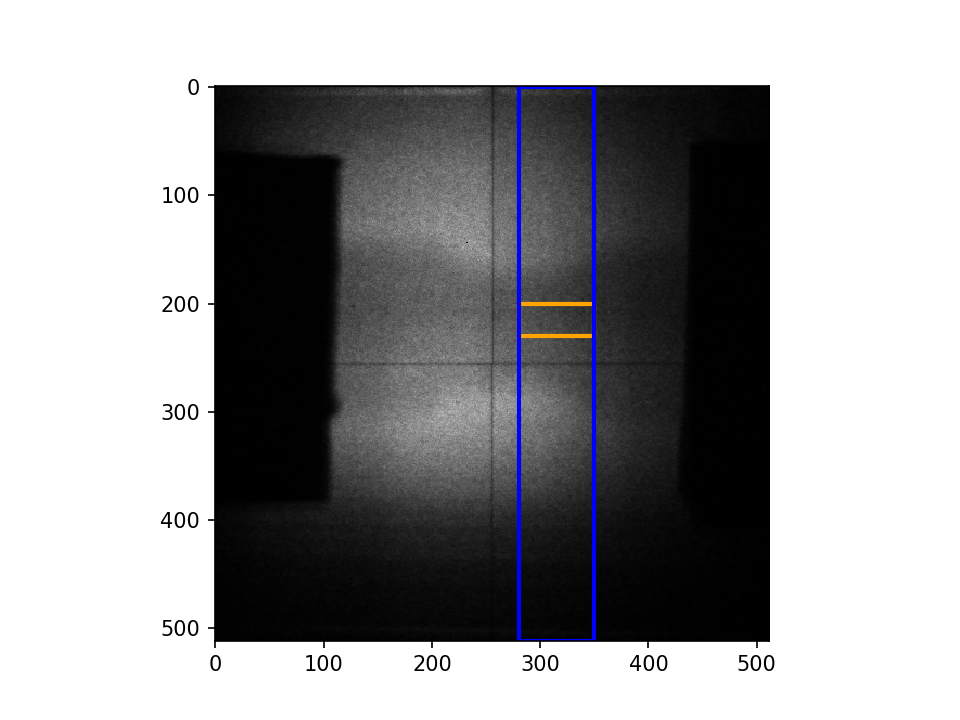

#18_bin_python


<IPython.core.display.Javascript object>


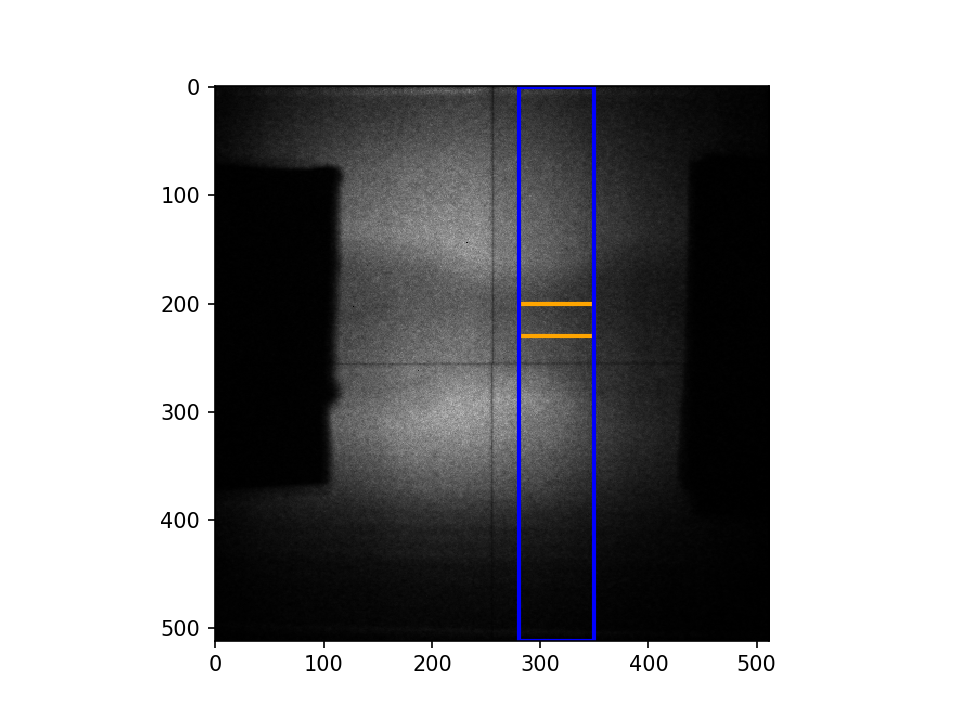

#19_bin_python


<IPython.core.display.Javascript object>


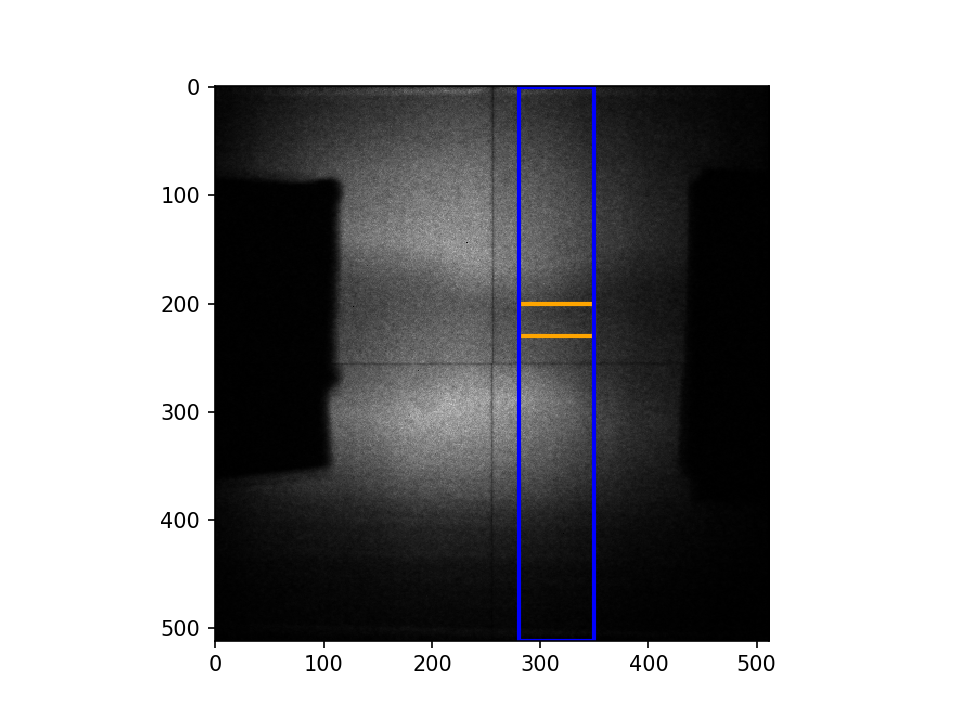

#20_bin_python


<IPython.core.display.Javascript object>


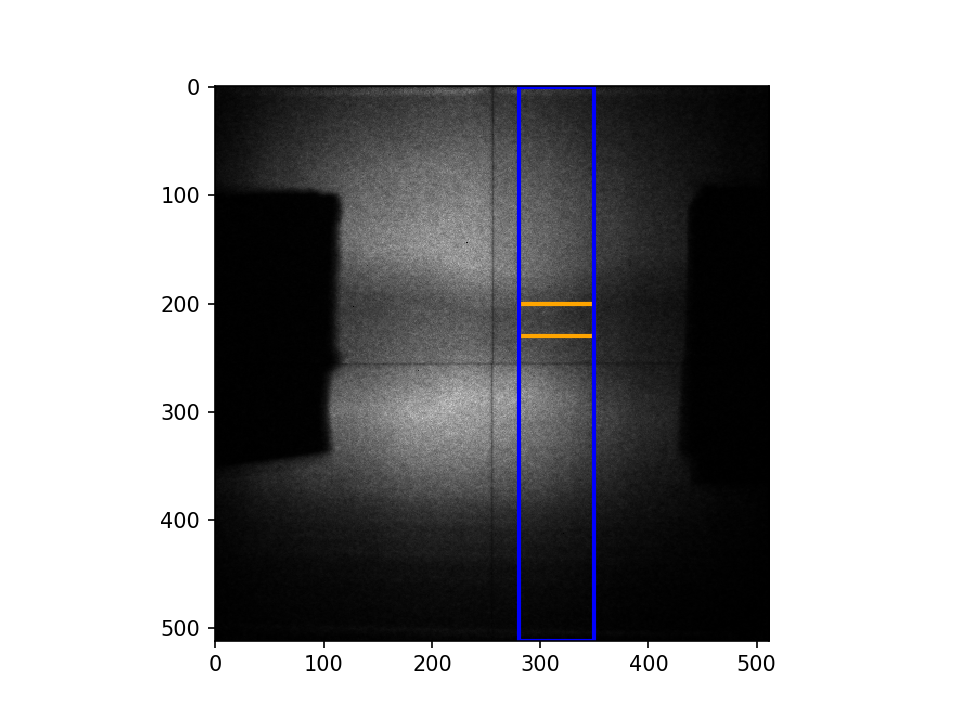

#21_bin_python


<IPython.core.display.Javascript object>


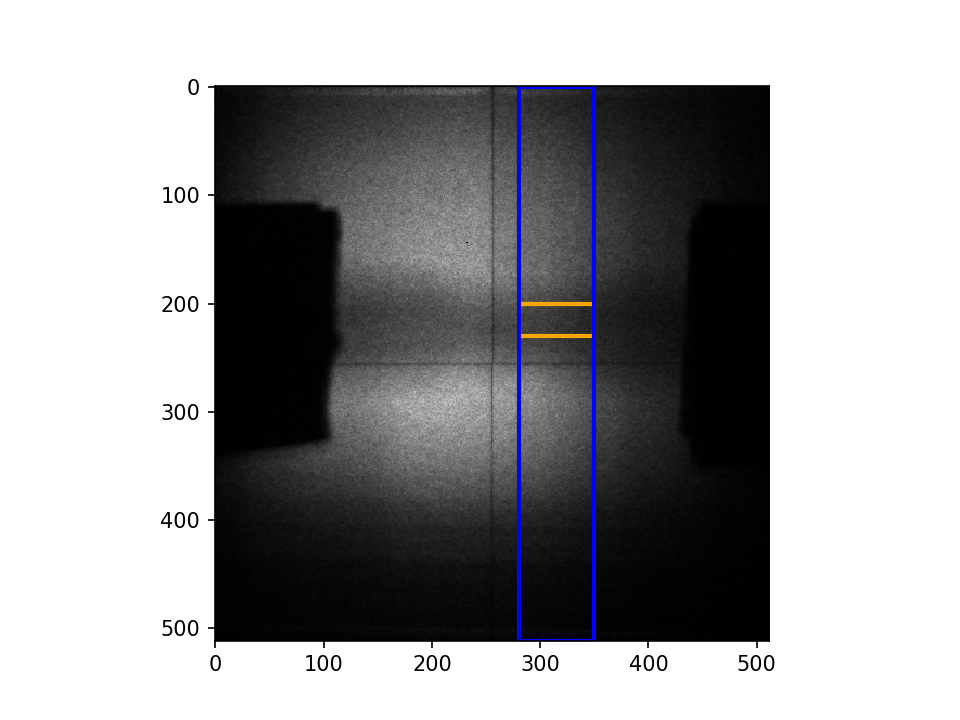

#22_bin_python


<IPython.core.display.Javascript object>


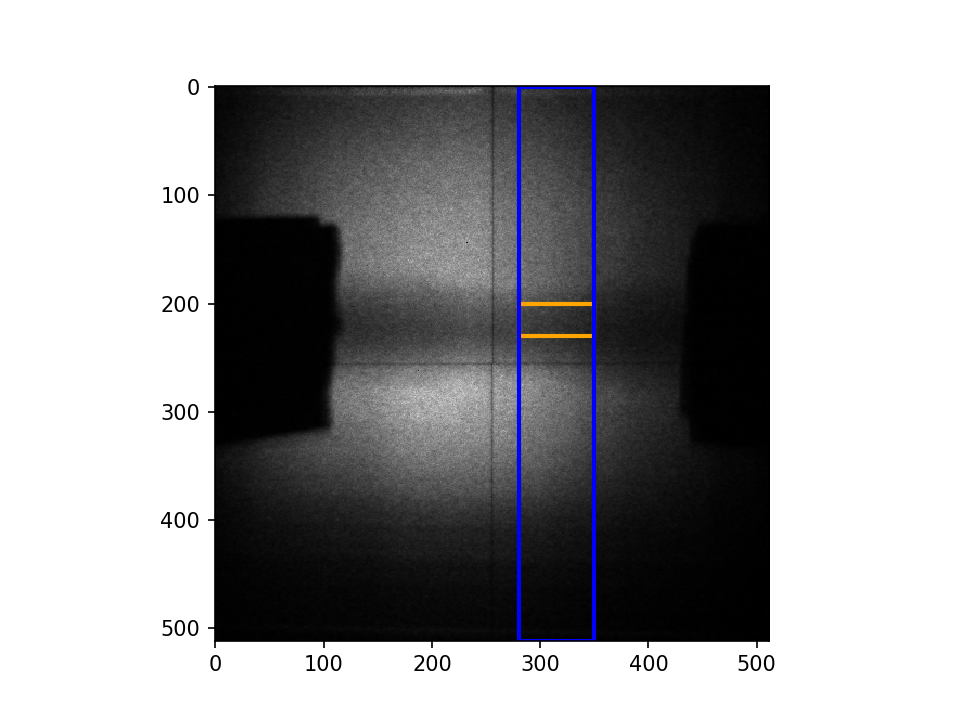

#23_bin_python


<IPython.core.display.Javascript object>


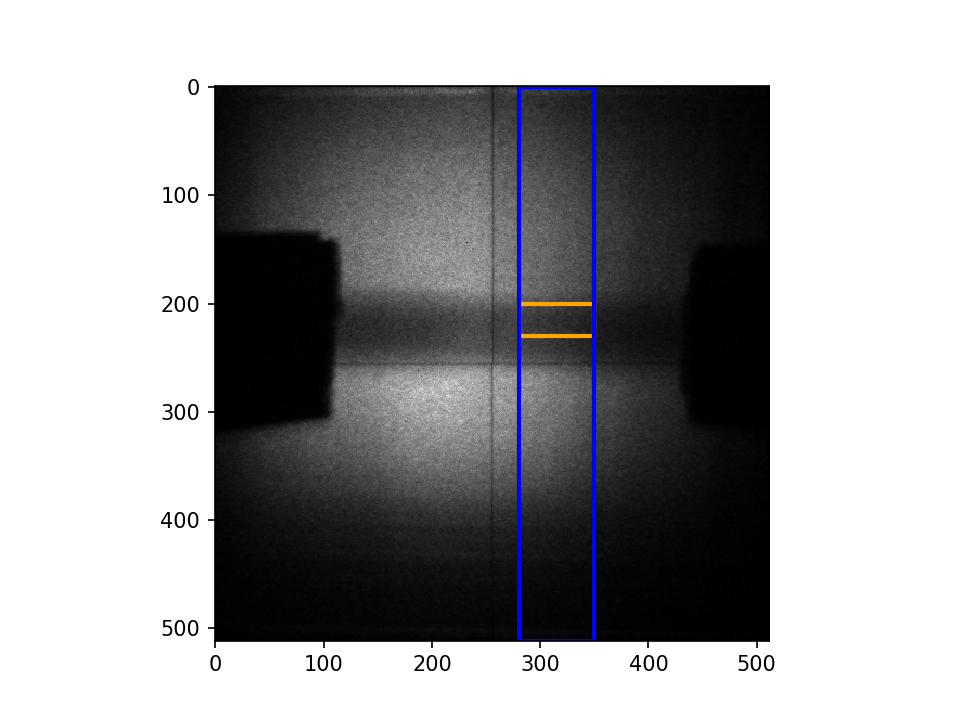

#24_bin_python


<IPython.core.display.Javascript object>


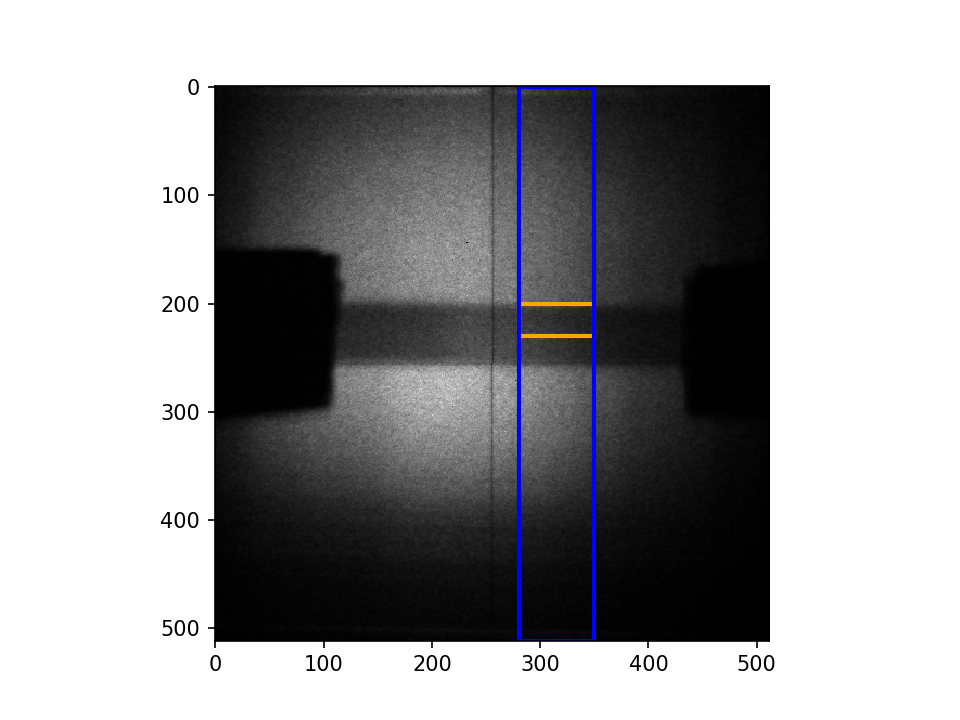

#25_bin_python


<IPython.core.display.Javascript object>


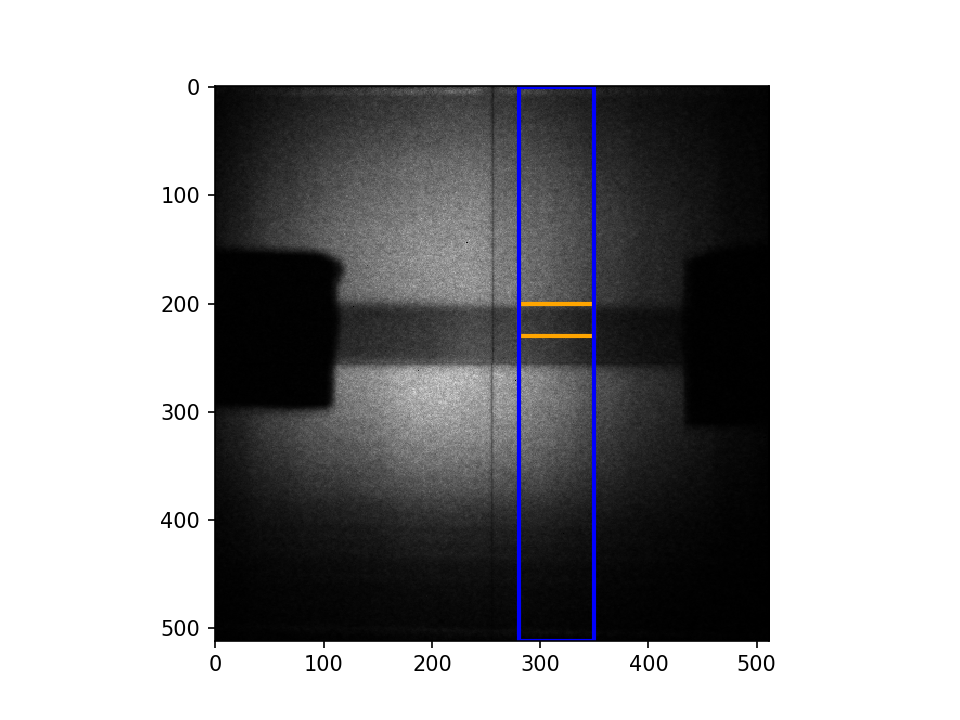

#26_bin_python


<IPython.core.display.Javascript object>


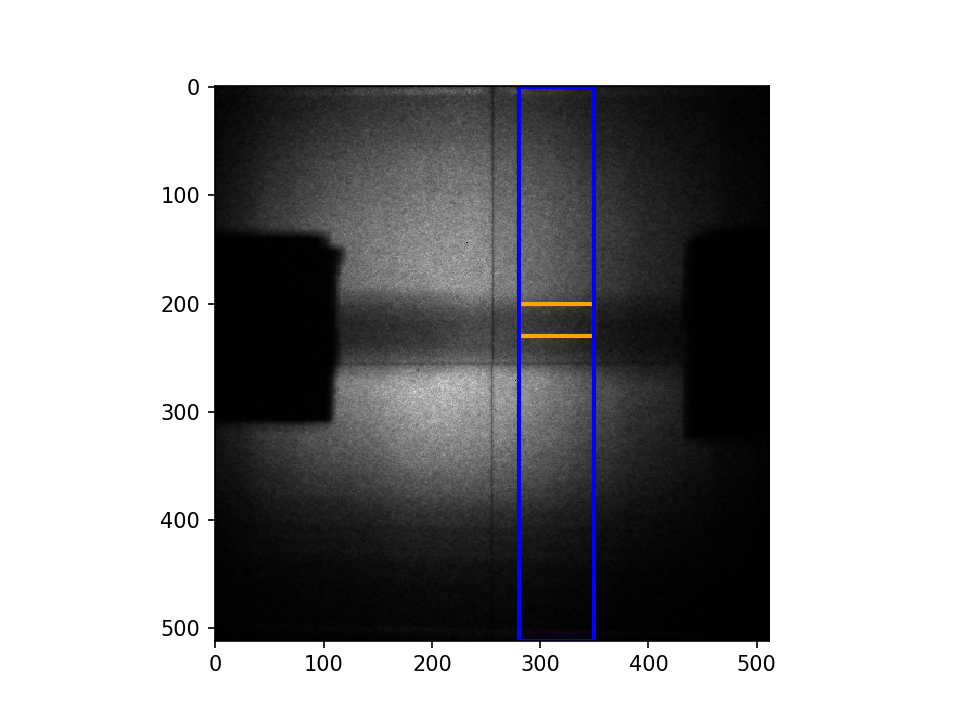

#27_bin_python


<IPython.core.display.Javascript object>


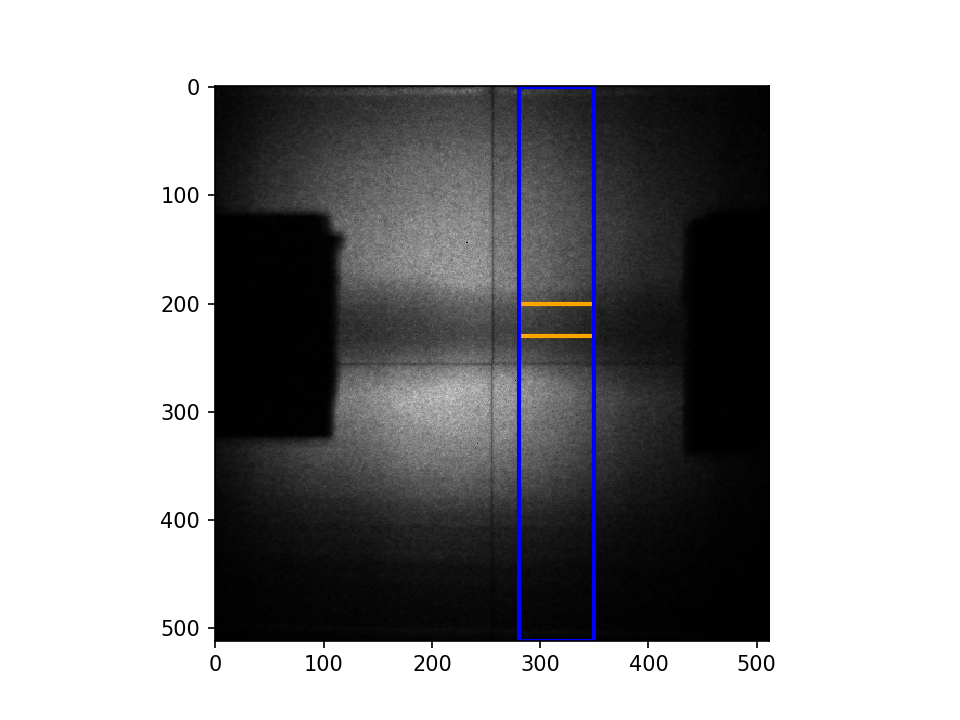

#28_bin_python


<IPython.core.display.Javascript object>


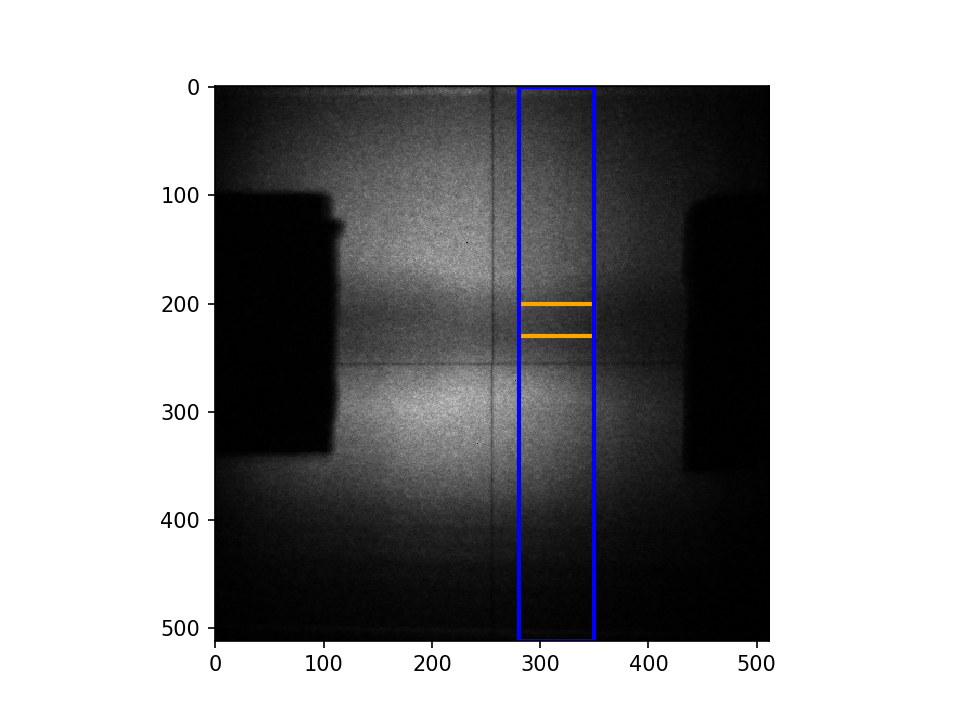

#29_bin_python


<IPython.core.display.Javascript object>


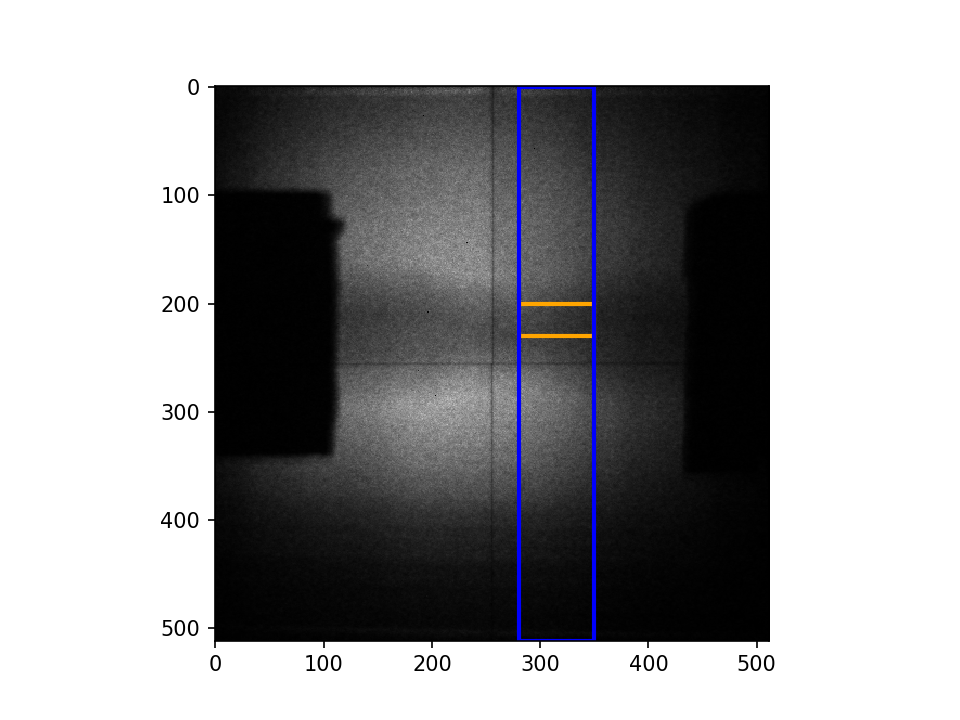

#30_bin_python


<IPython.core.display.Javascript object>


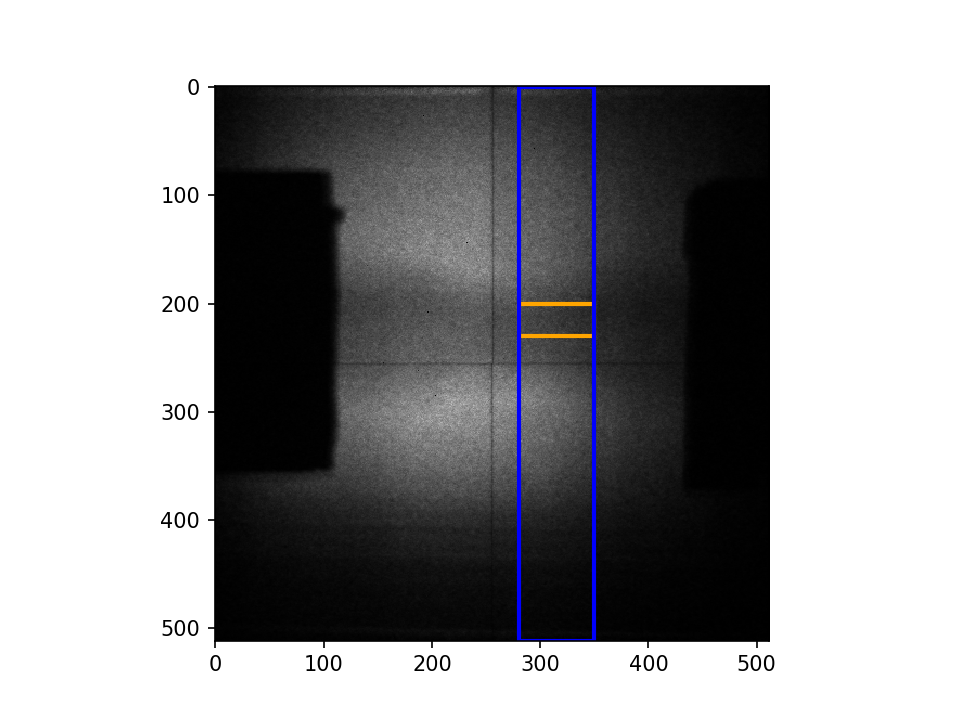

#31_bin_python


<IPython.core.display.Javascript object>


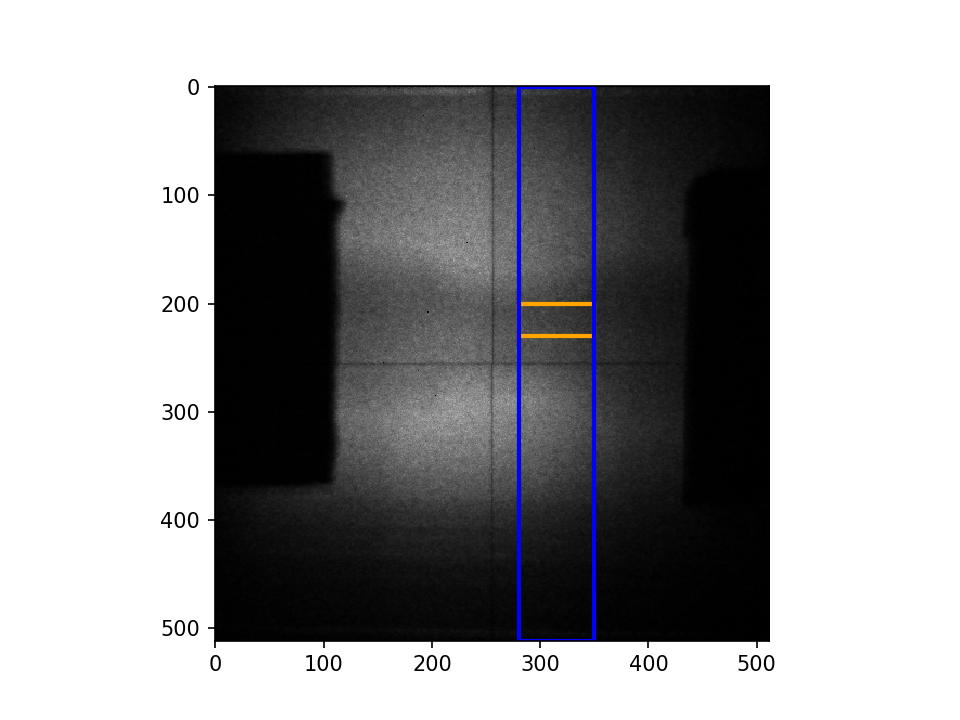

#32_bin_python


<IPython.core.display.Javascript object>


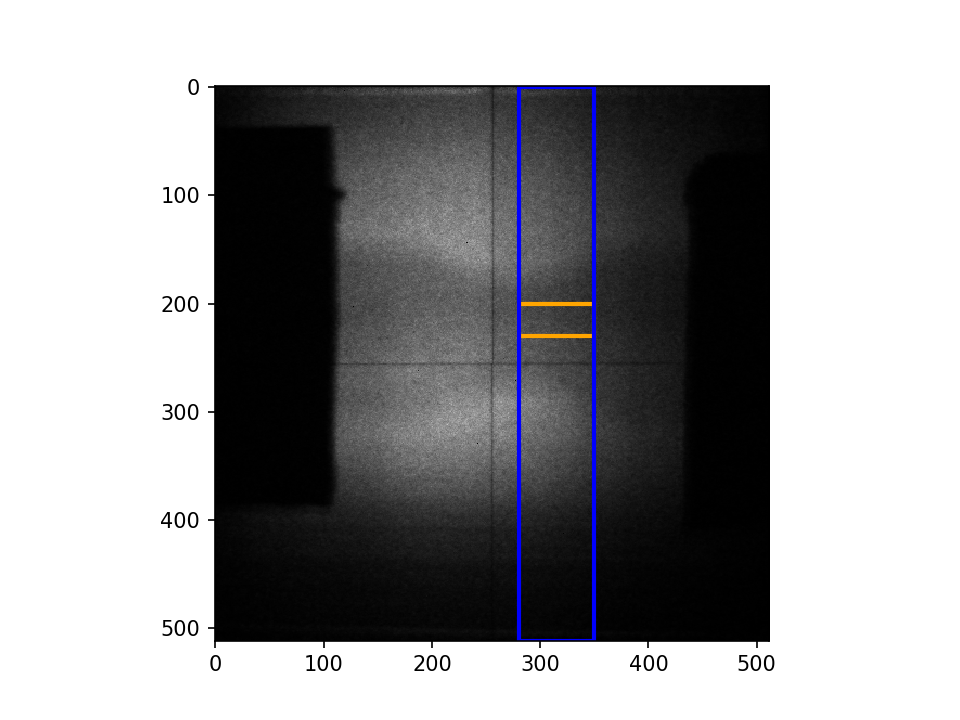

#33_bin_python


<IPython.core.display.Javascript object>


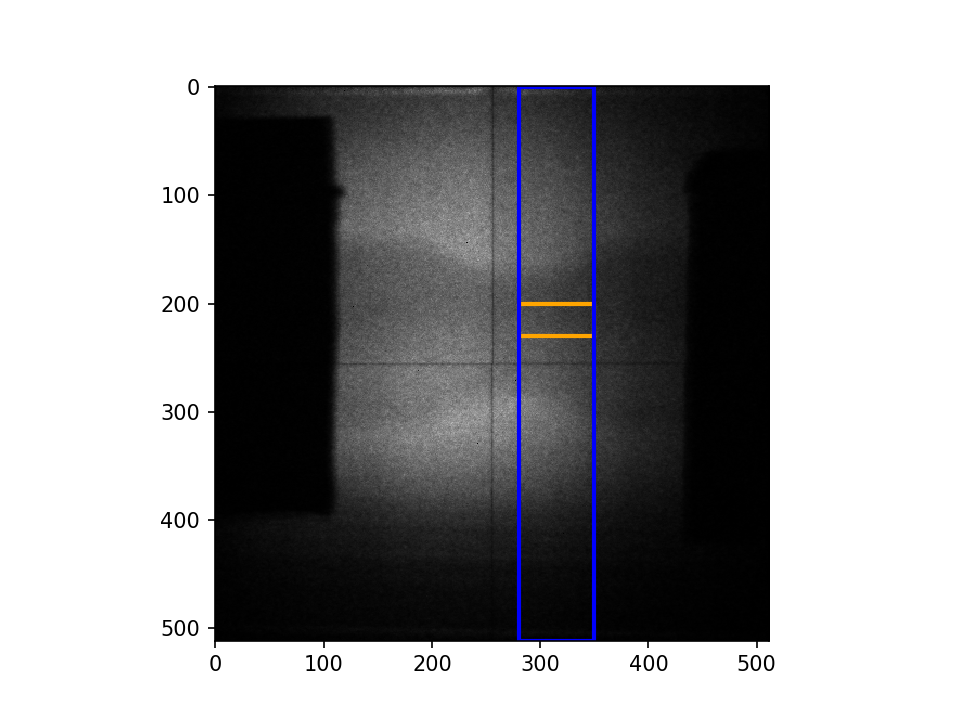

#34_bin_python


<IPython.core.display.Javascript object>


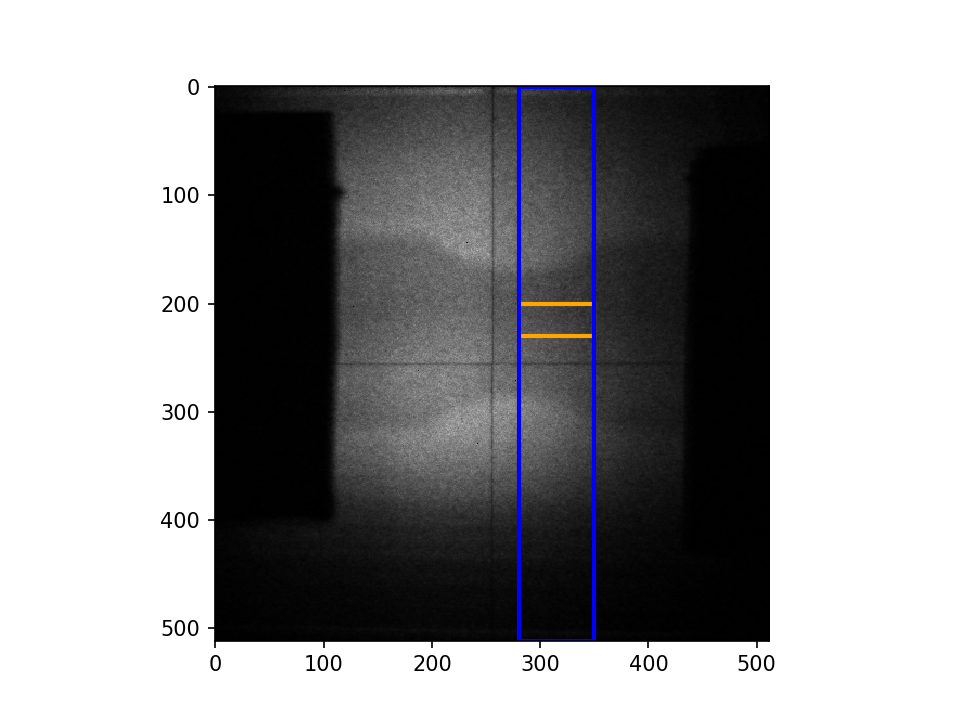

#35_bin_python


<IPython.core.display.Javascript object>


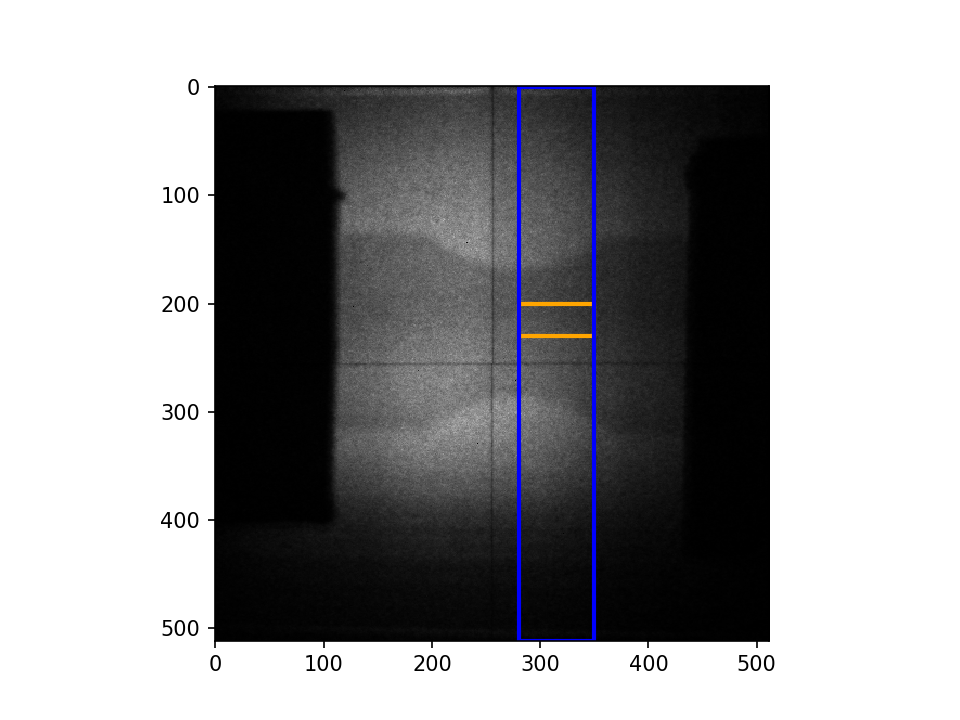

#36_bin_python


<IPython.core.display.Javascript object>


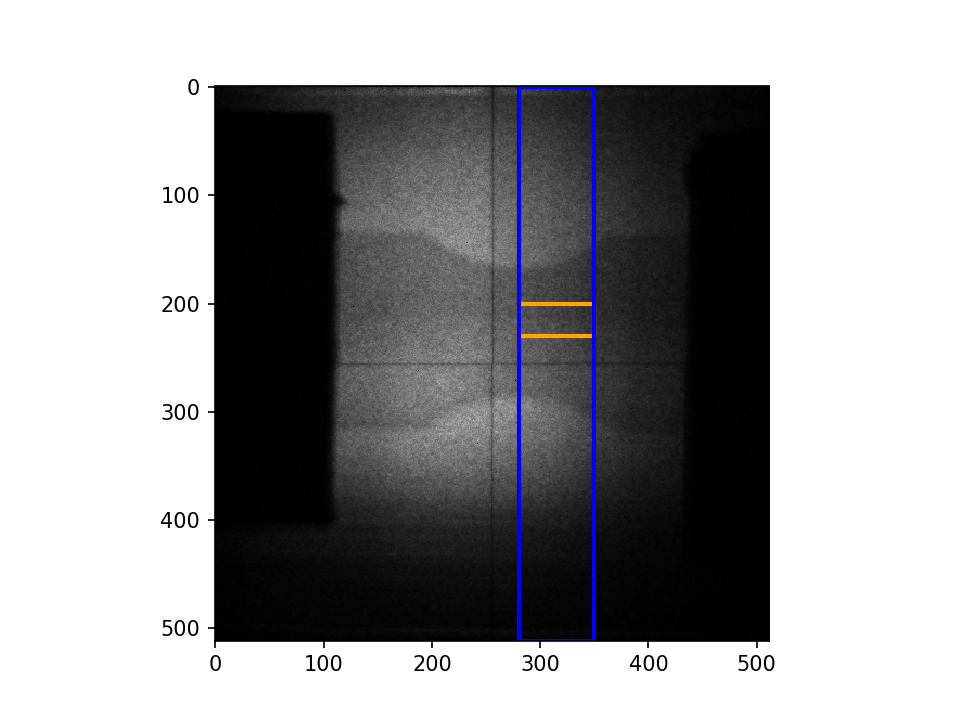

#37_bin_python


<IPython.core.display.Javascript object>


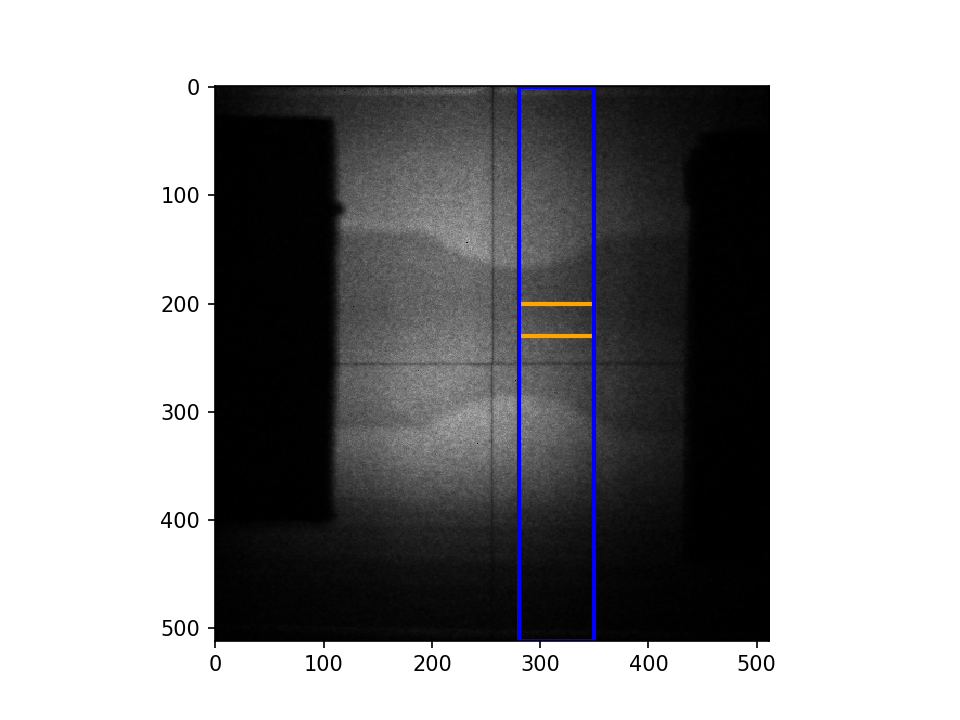

#38_bin_python


<IPython.core.display.Javascript object>


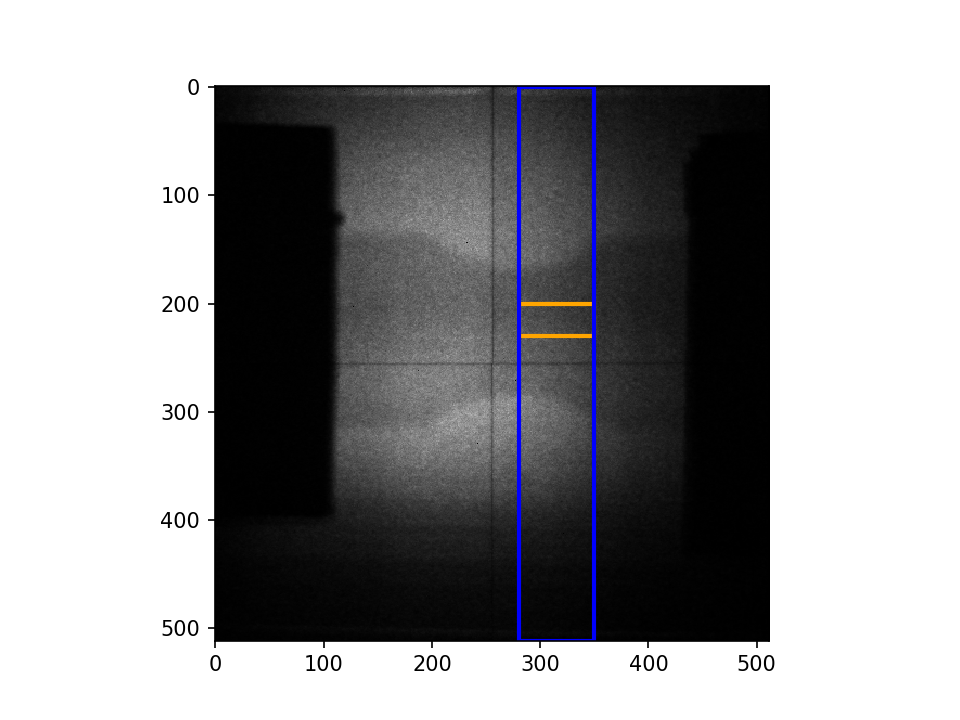

#39_bin_python


<IPython.core.display.Javascript object>


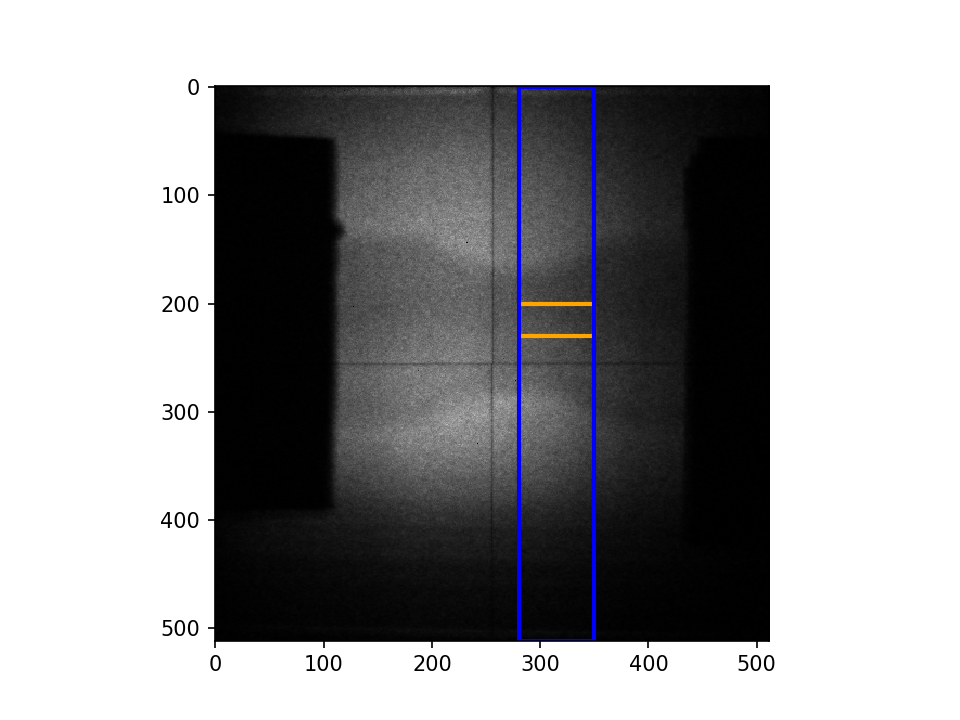

#40_bin_python


<IPython.core.display.Javascript object>


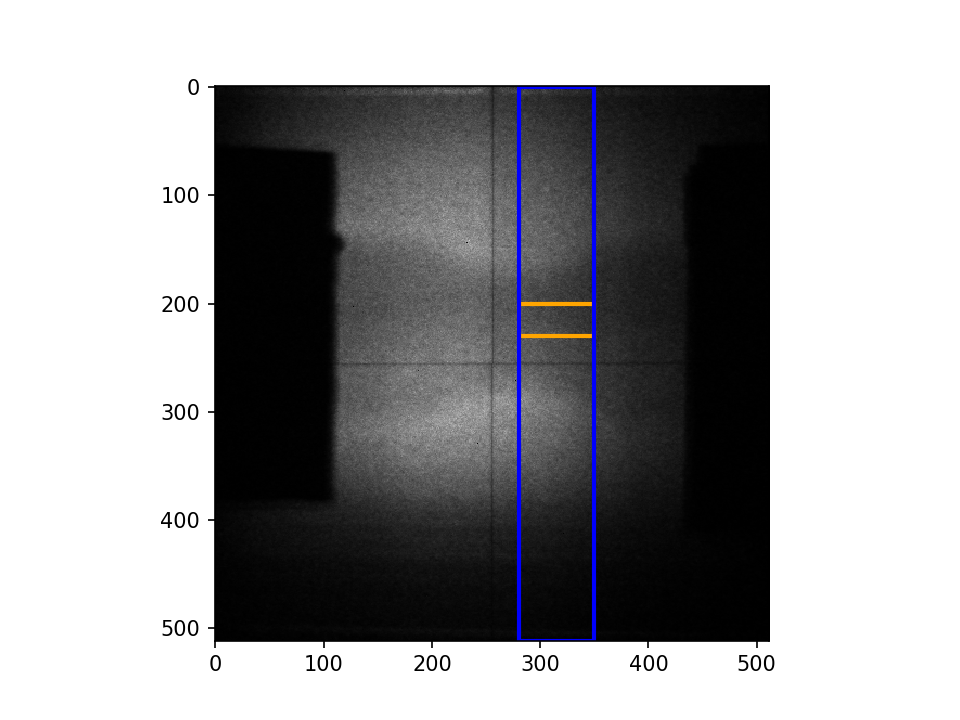

#41_bin_python


<IPython.core.display.Javascript object>


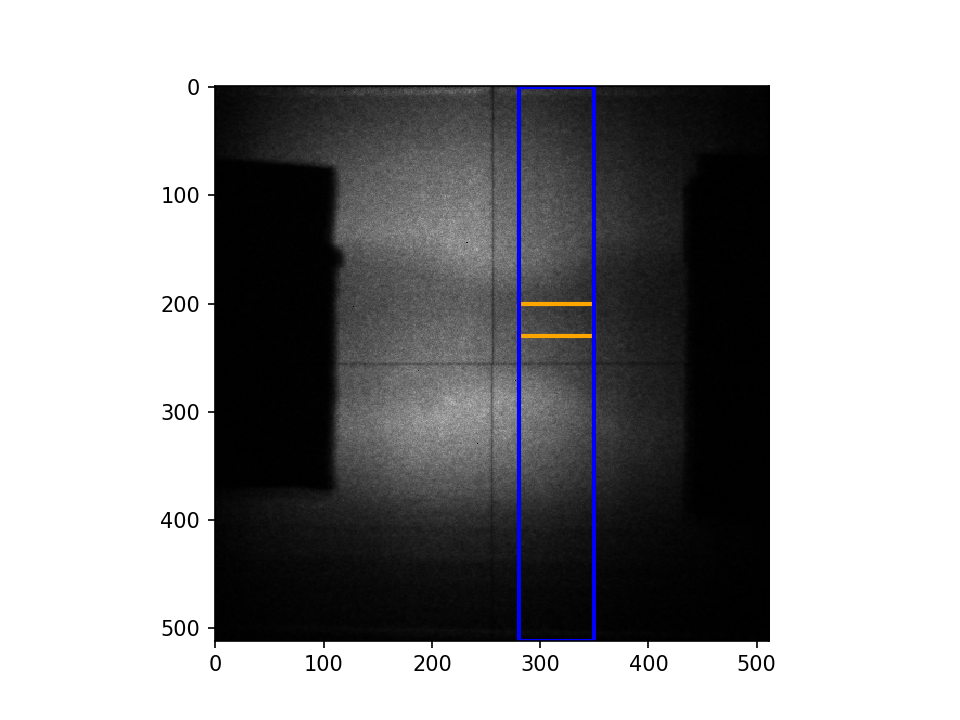

#42_bin_python


<IPython.core.display.Javascript object>


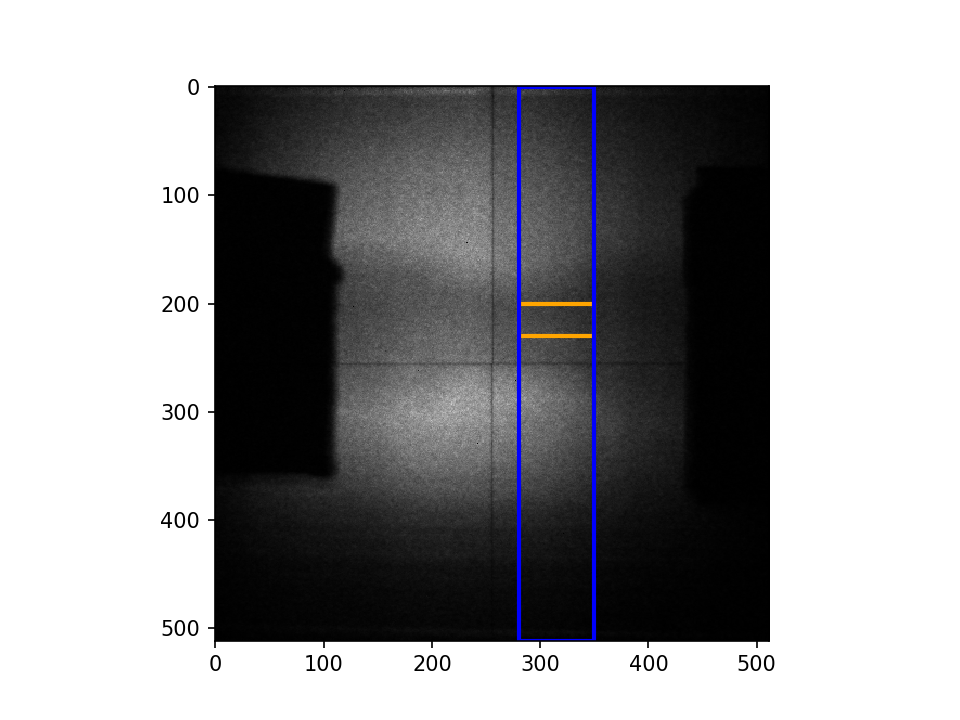

#43_bin_python


<IPython.core.display.Javascript object>


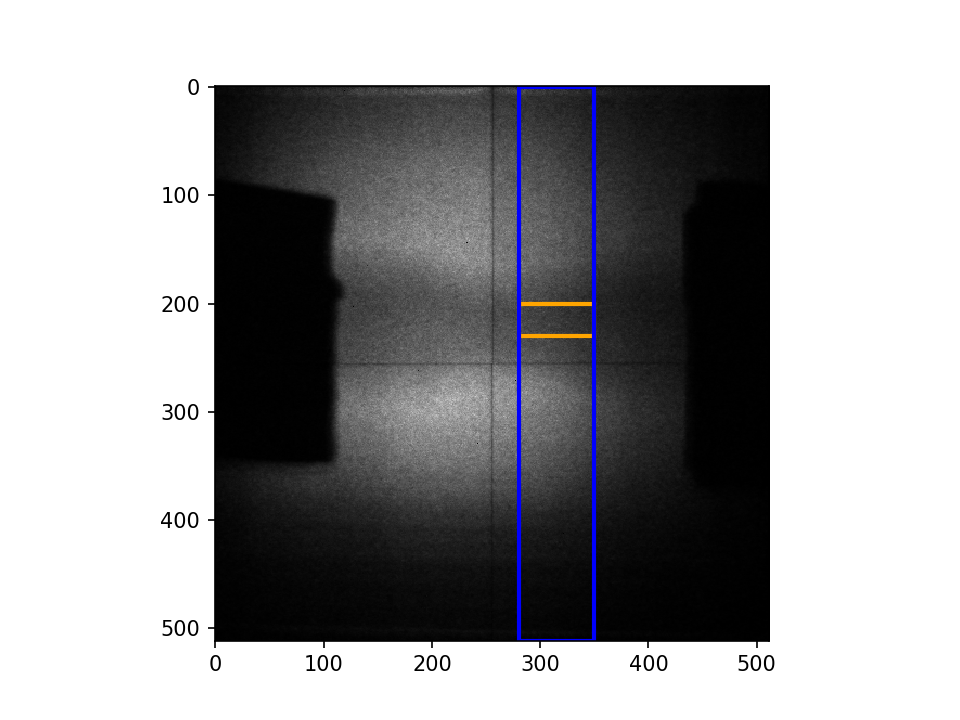

#44_bin_python


<IPython.core.display.Javascript object>


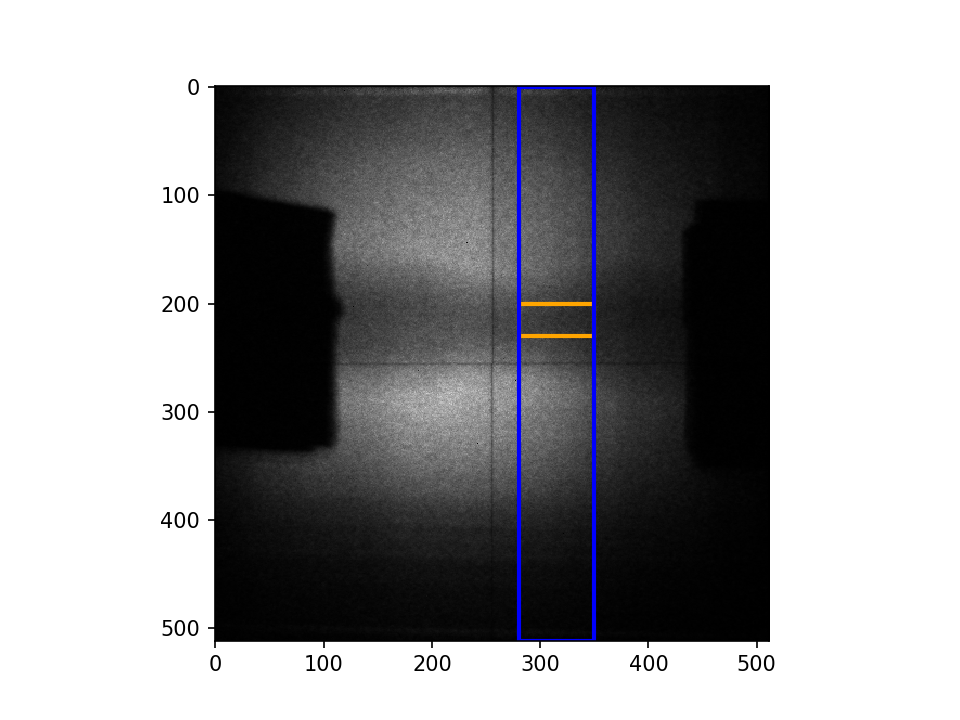

#45_bin_python


<IPython.core.display.Javascript object>


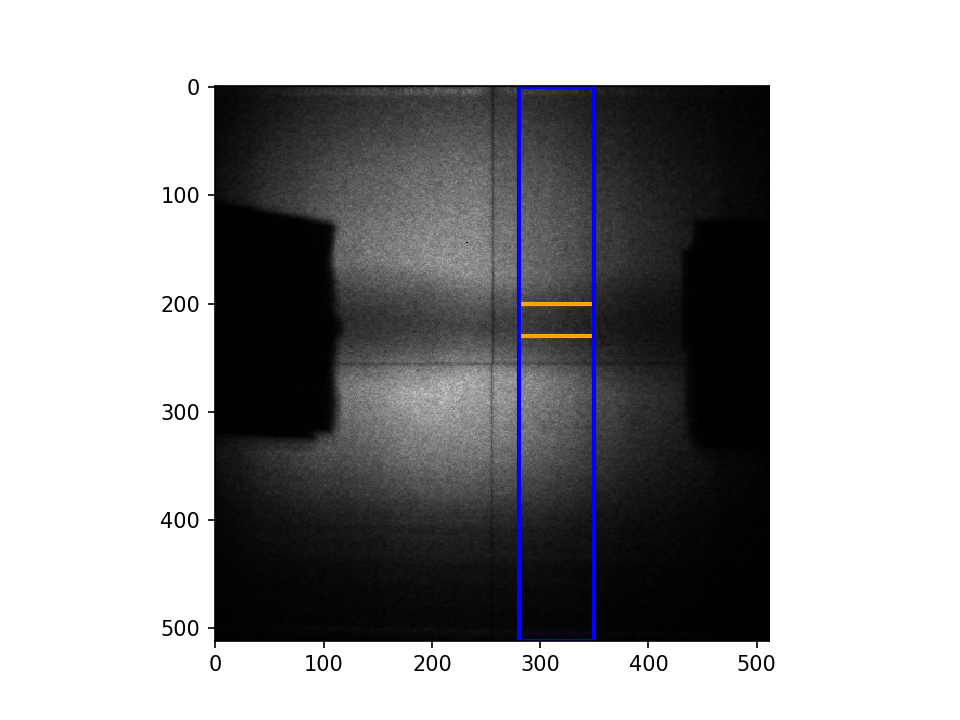

#46_bin_python


<IPython.core.display.Javascript object>


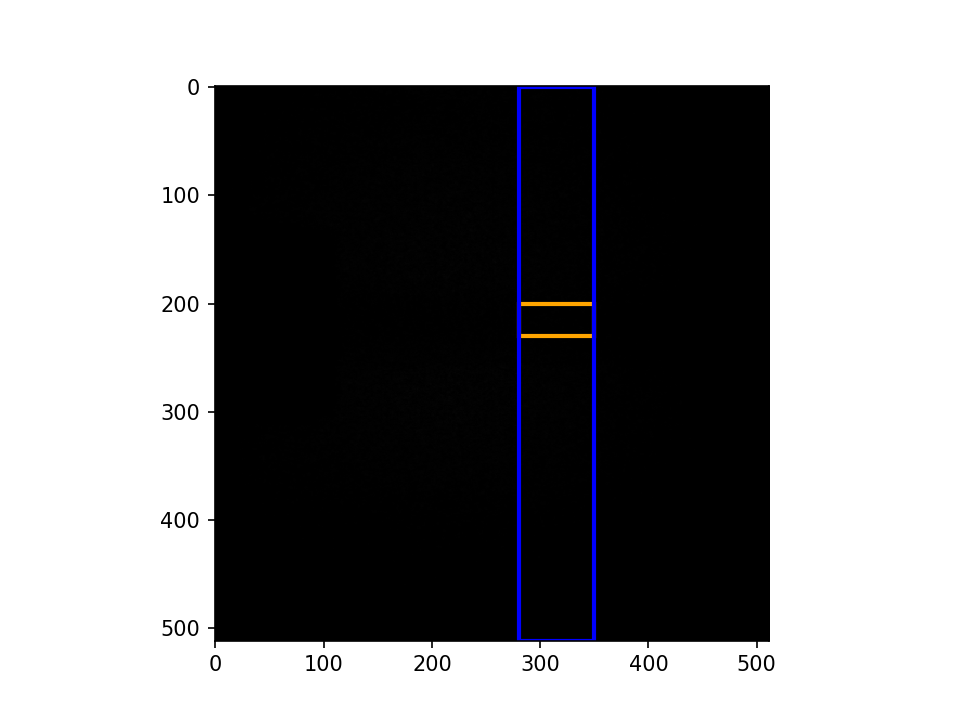

#47_bin_python


<IPython.core.display.Javascript object>


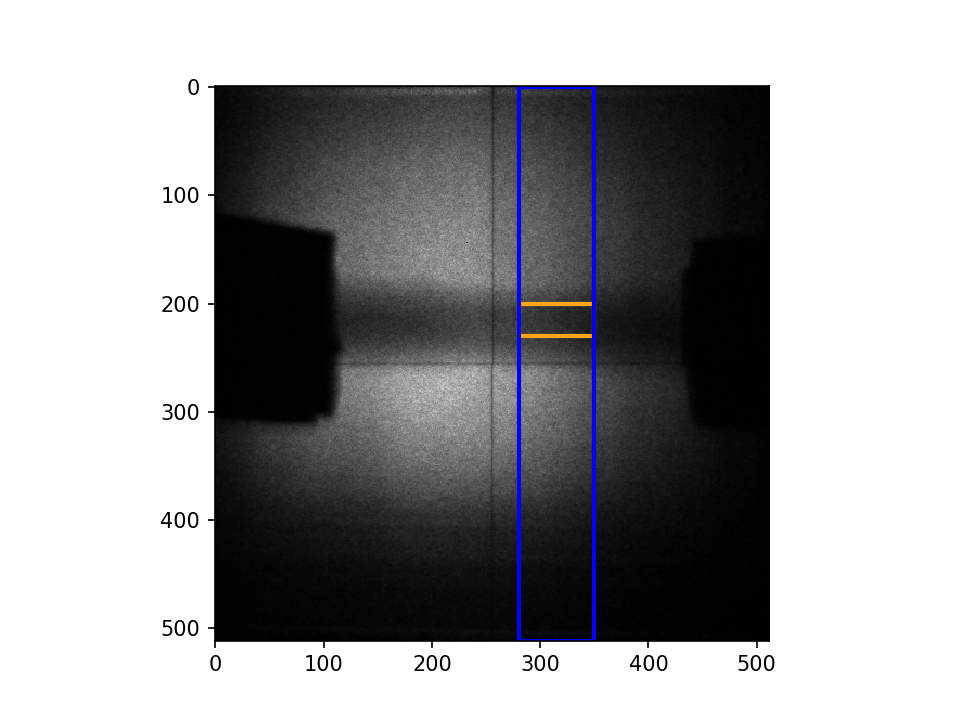

#48_bin_python


<IPython.core.display.Javascript object>


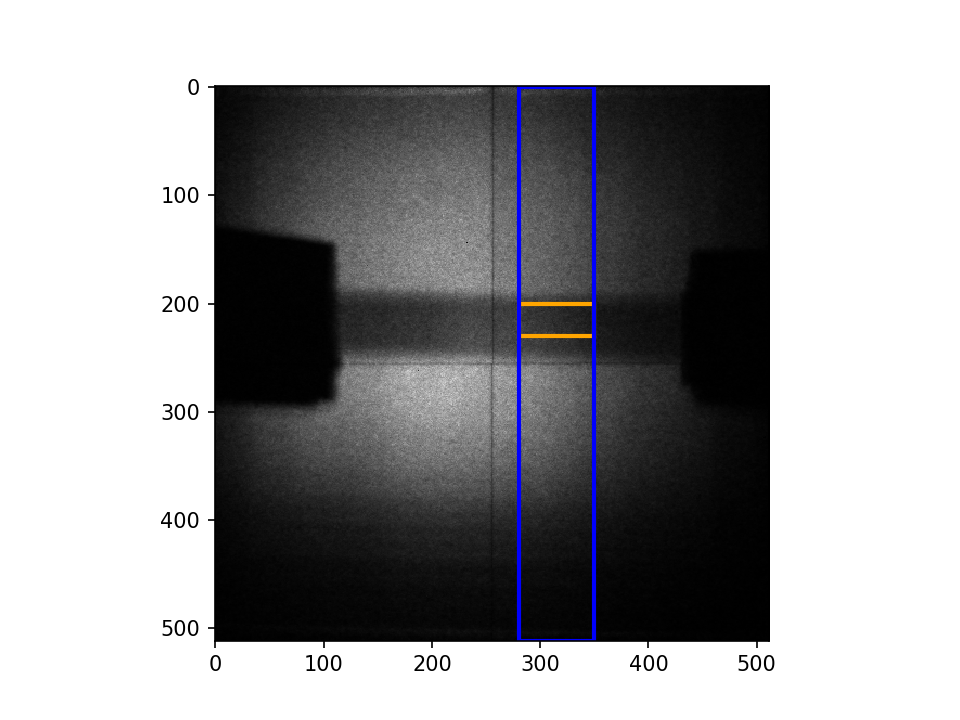

#49_bin_python


<IPython.core.display.Javascript object>


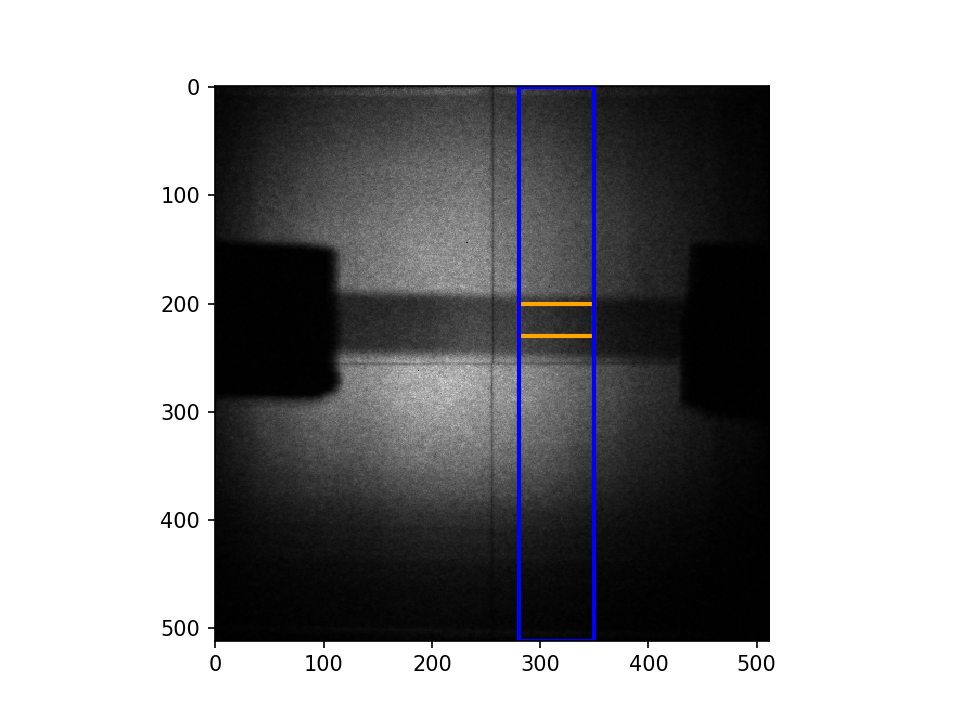

#50_bin_python


<IPython.core.display.Javascript object>


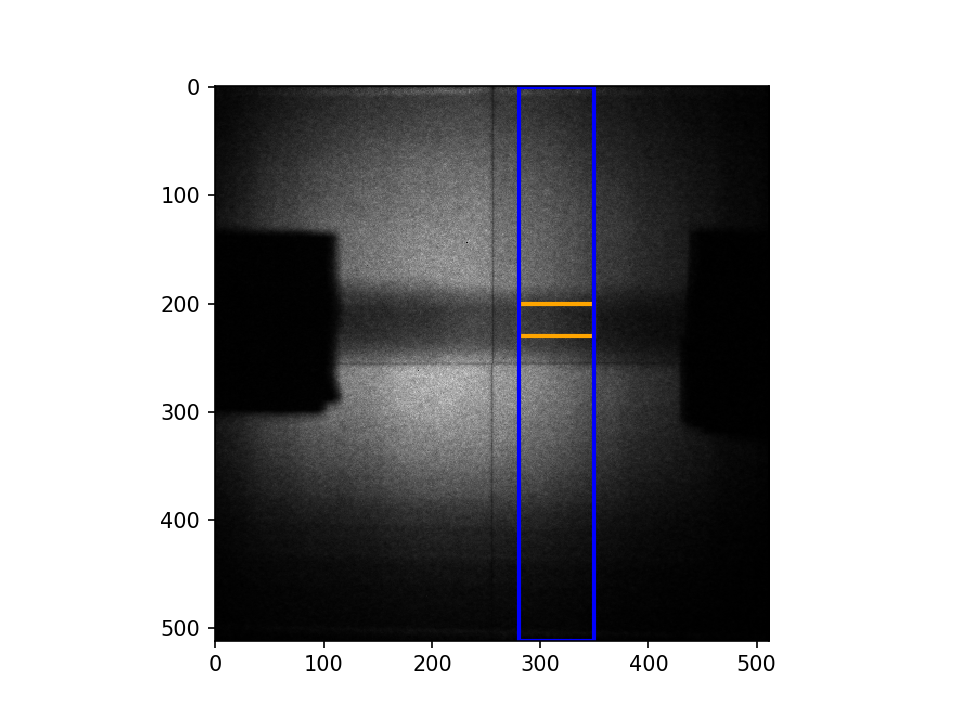

#51_bin_python


<IPython.core.display.Javascript object>


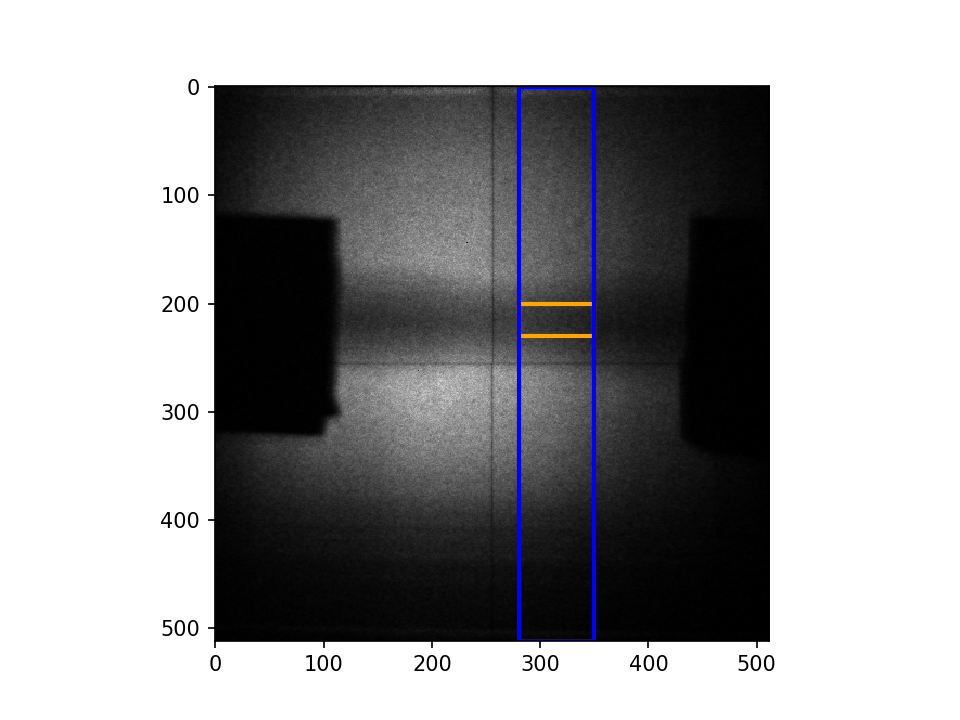

#52_bin_python


<IPython.core.display.Javascript object>


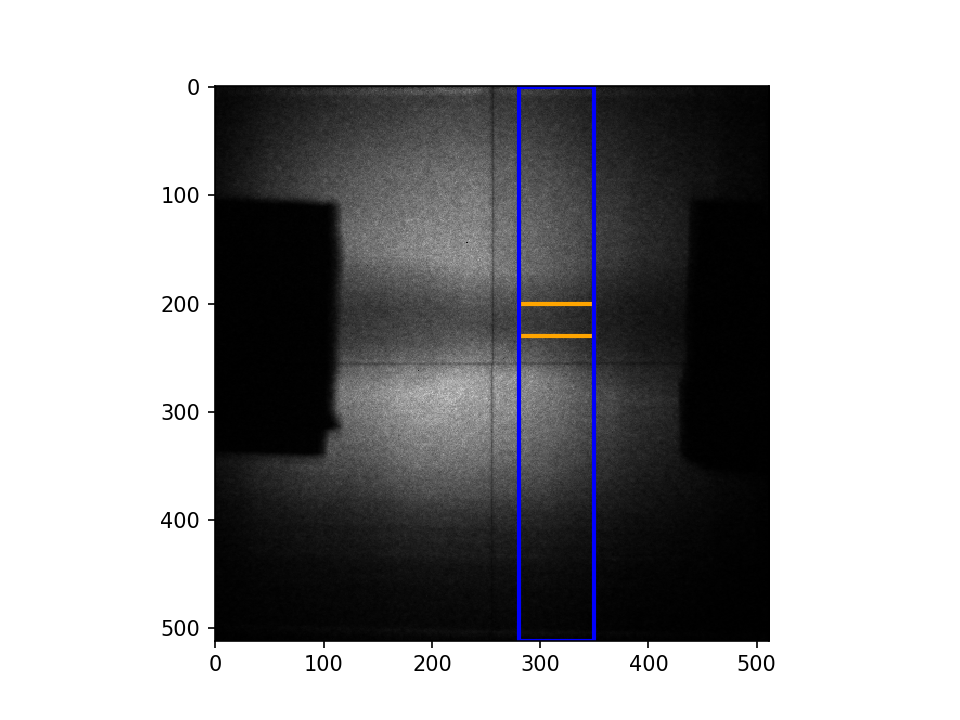

#53_bin_python


<IPython.core.display.Javascript object>


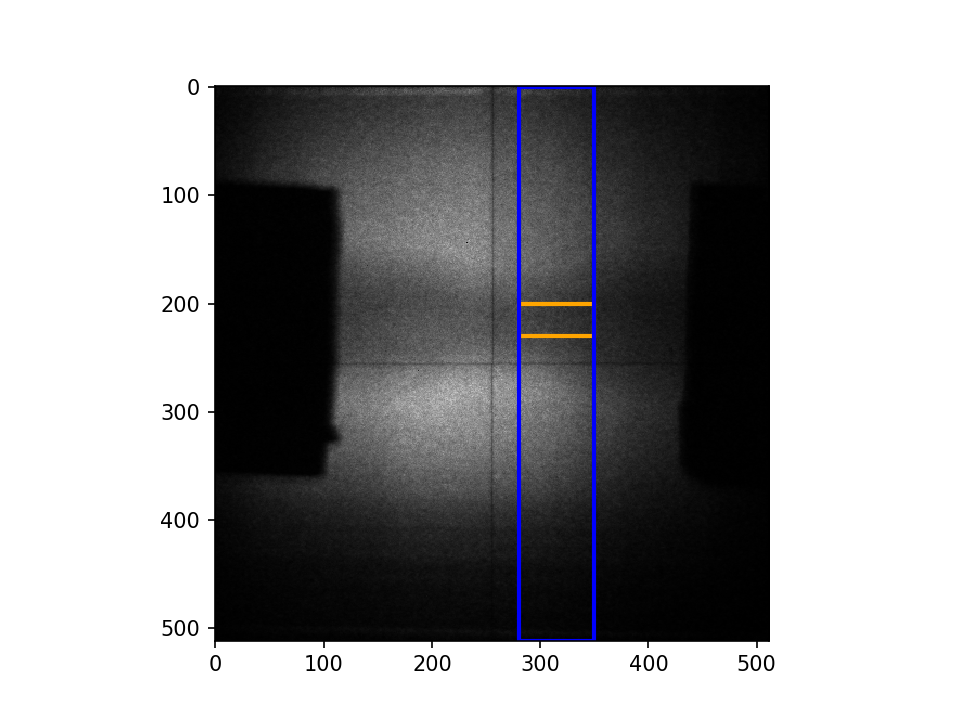

#54_bin_python


<IPython.core.display.Javascript object>


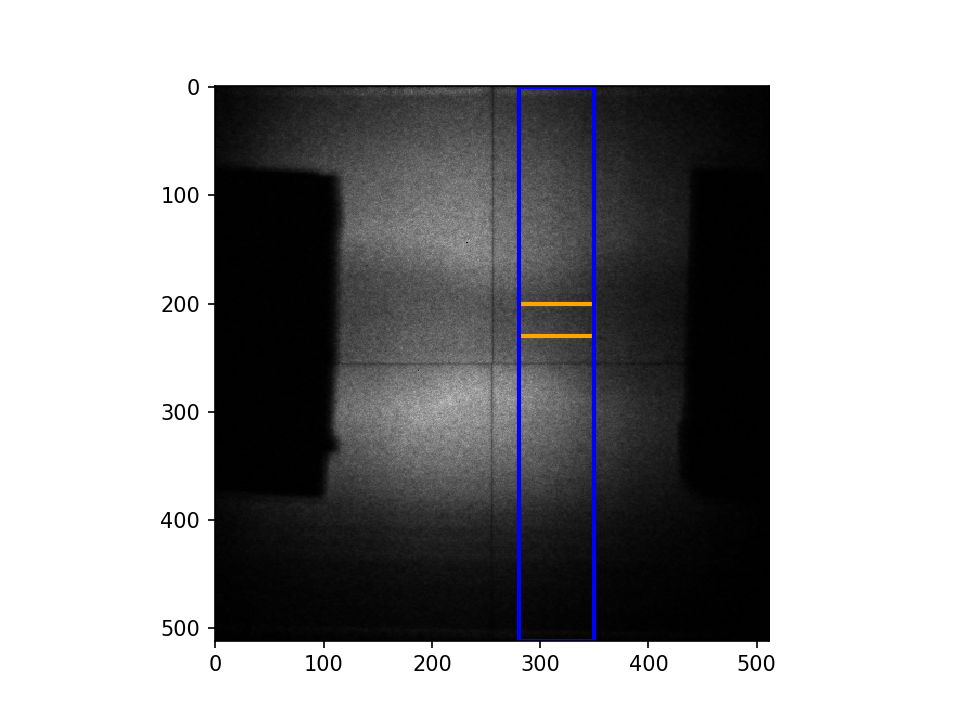

#55_bin_python


<IPython.core.display.Javascript object>


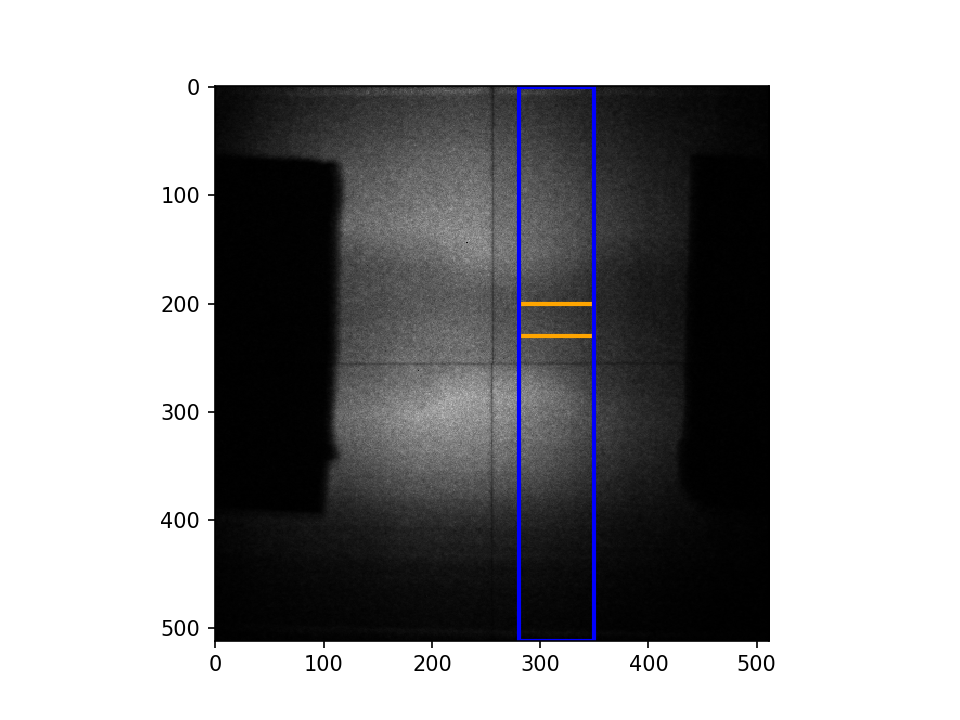

#56_bin_python


<IPython.core.display.Javascript object>


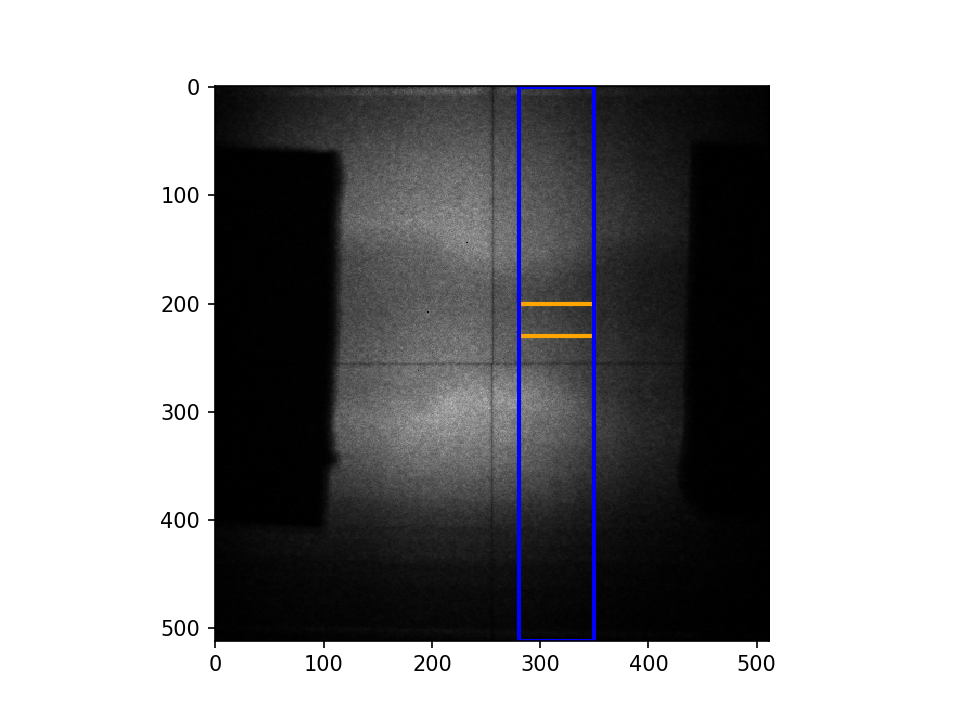

#57_bin_python


<IPython.core.display.Javascript object>


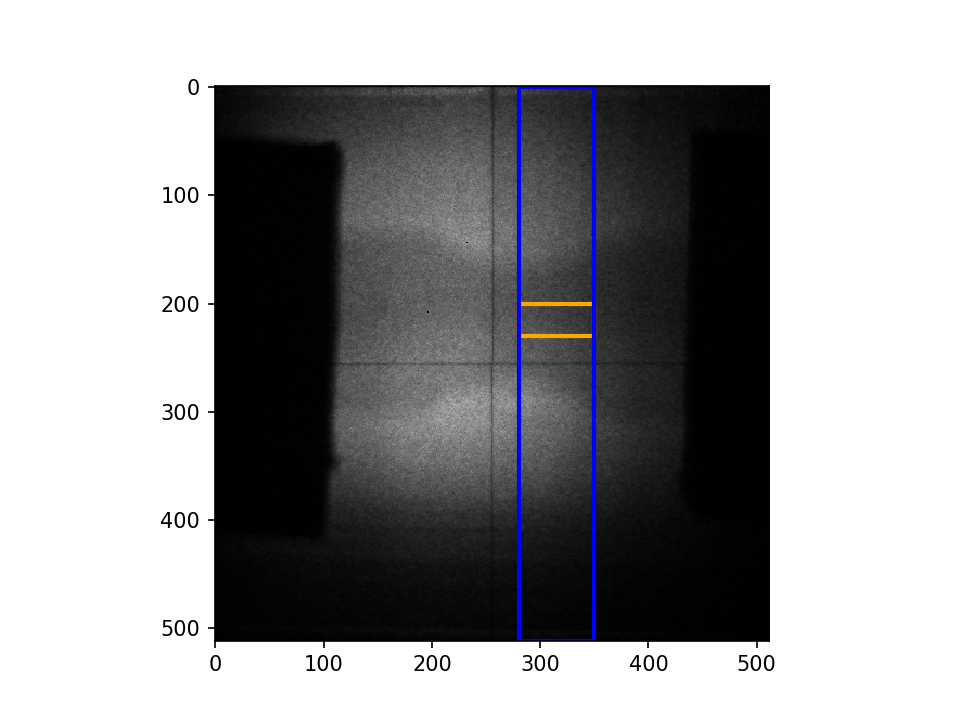

#58_bin_python


<IPython.core.display.Javascript object>


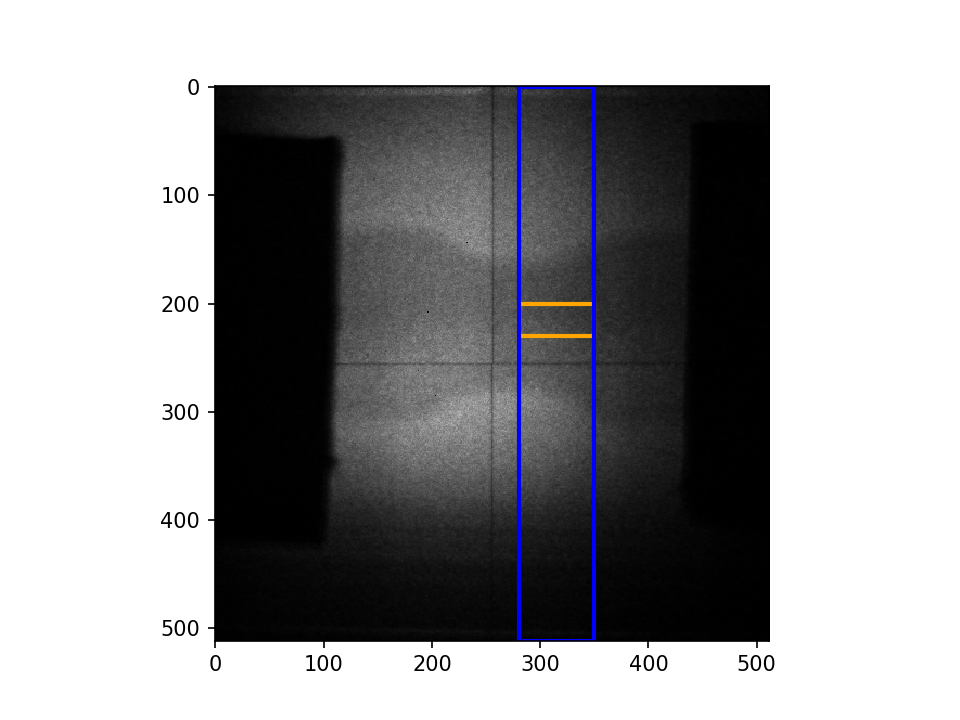

#59_bin_python


<IPython.core.display.Javascript object>


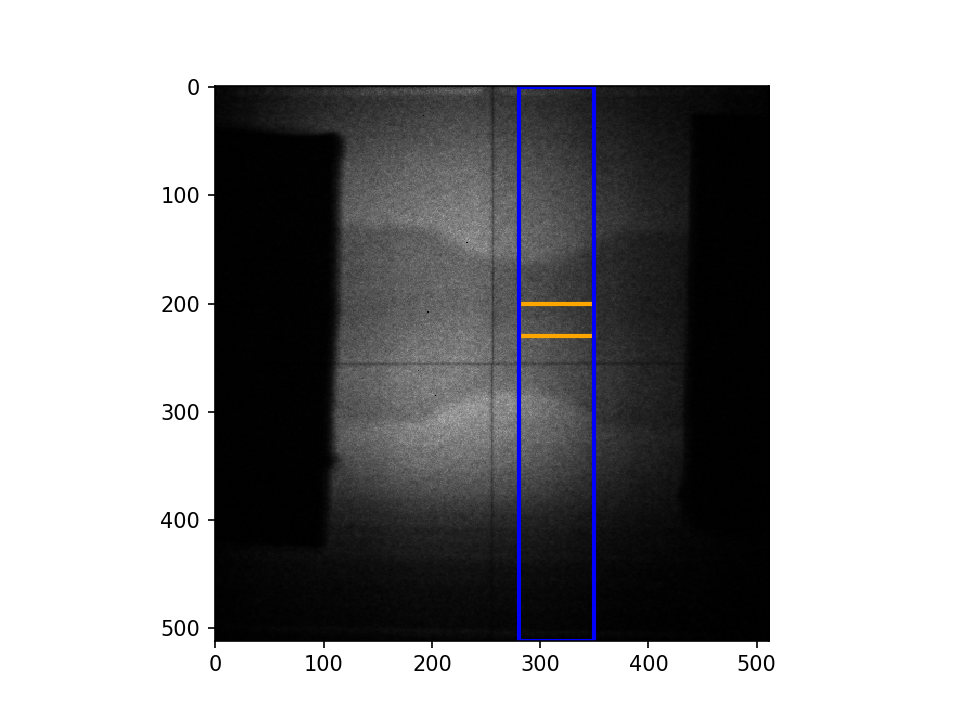

In [81]:
#determine the ROI 
%matplotlib notebook
for i in range(0, len(myfiles1)):
    pathdata1= rootdir1+ myfiles1[i]+"/"
    coll_files1=sorted(fnmatch.filter(listdir(pathdata1),'*.fits'))    
    roi=np.array([280,200,350,230]) # (x1,y1,x2,y2 across the diagnol starting from up to down)
    roi_1=np.array([280,0,350,512]) # (x1,y1,x2,y2 across the diagnol starting from up to down)
    print(myfiles1[i])
    fig,ax =plt.subplots()
    myim=fits.open(pathdata1+coll_files1[150])[0].data.astype(float)
    ax.imshow(myim, vmin=0, vmax=200, cmap="gray")
    roi_p= patches.Polygon([(280,200),(350,200),(350,230),(280,230)], edgecolor='orange', facecolor='none',  linewidth=2)
    roi_p_1= patches.Polygon([(280,0),(350,0),(350,512),(280,512)], edgecolor='blue', facecolor='none',  linewidth=2)
    ax.add_patch(roi_p)
    ax.add_patch(roi_p_1)

In [14]:
myfiles_OB = fnmatch.filter(listdir(pathOB),'*.fits')
coll_files_OB = sorted(myfiles_OB)
print(len(coll_files_OB))
spectrum_OB = np.zeros(len(coll_files_OB))

474


<IPython.core.display.Javascript object>


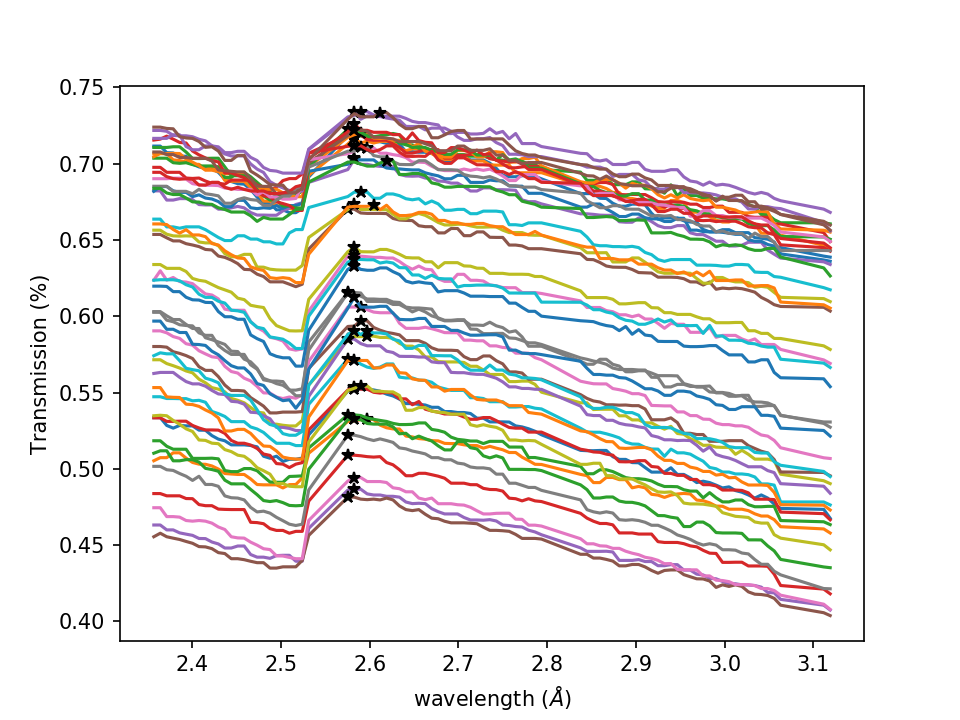

0
[26]
[2.58264224]
[0.71898058]
1
[26]
[2.58264224]
[0.71679625]
2
[26]
[2.58264224]
[0.71925021]
3
[26]
[2.58264224]
[0.71876591]
4
[26]
[2.58264224]
[0.7029132]
5
[25]
[2.57536677]
[0.67022024]
6
[26]
[2.58264224]
[0.64049975]
7
[25]
[2.57536677]
[0.61538153]
8
[28]
[2.59719317]
[0.58701183]
9
[25]
[2.57536677]
[0.57197578]
10
[26]
[2.58264224]
[0.55245306]
11
[28]
[2.59719317]
[0.53286157]
12
[25]
[2.57536677]
[0.53538646]
13
[26]
[2.58264224]
[0.55396213]
14
[25]
[2.57536677]
[0.58502541]
15
[27]
[2.5899177]
[0.59704469]
16
[27]
[2.5899177]
[0.60624604]
17
[25]
[2.57536677]
[0.61562214]
18
[26]
[2.58264224]
[0.64514407]
19
[27]
[2.5899177]
[0.68138477]
20
[26]
[2.58264224]
[0.70359509]
21
[27]
[2.5899177]
[0.71992135]
22
[25]
[2.57536677]
[0.72268631]
23
[26]
[2.58264224]
[0.72632507]
24
[26]
[2.58264224]
[0.73393465]
25
[26]
[2.58264224]
[0.72218501]
26
[28]
[2.59719317]
[0.71040139]
27
[27]
[2.5899177]
[0.71079718]
28
[26]
[2.58264224]
[0.67357976]
29
[26]
[2.58264224]
[0.637246

In [115]:
# for stress 1
%matplotlib notebook
open('texture1_1.txt', "w").close() # clears anything written in the file
f_1 = open('texture1_1.txt','ab')
# open('texture1_2.txt', "w").close() # clears anything written in the file
# f_2 = open('texture1_2.txt','ab')
# for i in range(0, len(myfiles1)):
for i in range(0,len(myfiles1)):
    if (i != 33) :        
        spectrum_sample1 = np.zeros(len(coll_files1))
        pathdata1= rootdir1+ myfiles1[i]+"/"
        coll_files1=sorted(fnmatch.filter(listdir(pathdata1),'*.fits'))
        for j in range(0, len(coll_files1)):
            with fits.open(pathdata1+coll_files1[j]) as im:
                data=im[0].data[roi[1]:roi[3],roi[0]:roi[2]].astype(float)
                spectrum_sample1[j]=np.sum(data[~np.isnan(data) & ~np.isinf(data)])
            with fits.open(pathOB+coll_files_OB[j]) as im_ob:
                ob=im_ob[0].data[roi[1]:roi[3],roi[0]:roi[2]].astype(float)
                spectrum_OB[j]=np.sum(ob[~np.isnan(ob) & ~np.isinf(ob)])
        spectrum_norm1=(spectrum_sample1/spectrum_OB)
        mylambda_peaks1_1 = mylambda[210:300]
        spectrum_norm_peaks1_1=sig.medfilt(spectrum_norm1[210:300])
        np.savetxt('spectrum_norm1_1',np.vstack((mylambda_peaks1_1, spectrum_norm_peaks1_1)).T,fmt= ('%2.5f'),delimiter = '\t')
        peaks1_1, _ = find_peaks(spectrum_norm_peaks1_1 ,width = 6)
        plt.plot(mylambda_peaks1_1, spectrum_norm_peaks1_1,'-')
        plt.plot(mylambda_peaks1_1[peaks1_1],spectrum_norm_peaks1_1[peaks1_1],'k*')
        plt.xlabel('wavelength ($\AA$)')
        plt.ylabel('Transmission (%)')
        print(i)
        print(peaks1_1)
        print(mylambda_peaks1_1[peaks1_1])
        print(spectrum_norm_peaks1_1[peaks1_1])
# #         if (peaks1_1 < 50):
            
#         the second peak
#         mylambda_peaks1_2 = mylambda[330:390]
#         spectrum_norm_peaks1_2=spectrum_norm1[330:390]
#         np.savetxt('spectrum_norm1_2',np.vstack((mylambda_peaks1_2, spectrum_norm_peaks1_2)).T,fmt= ('%2.5f'),delimiter = '\t')
#         peaks1_2, _ = find_peaks(spectrum_norm_peaks1_2,width = 5)
#         plt.plot(mylambda_peaks1_2, spectrum_norm_peaks1_2,'-')
#         plt.plot(mylambda_peaks1_2[peaks1_2],spectrum_norm_peaks1_2[peaks1_2],'k*')
#         plt.xlabel('wavelength ($\AA$)')
#         plt.ylabel('Transmission (%)')
#         print(peaks1_2)
#         print(mylambda_peaks1_2[peaks1_2])
#         print(spectrum_norm_peaks1_2[peaks1_2])
        if (i < 33) :
            np.savetxt(f_1,np.vstack((i*8,i+13,mylambda_peaks1_1[peaks1_1][0], spectrum_norm_peaks1_1[peaks1_1][0])).T,fmt= ('%2.7f'),delimiter = '\t')
        else:
            np.savetxt(f_1,np.vstack(((i-1)*8,i+13,mylambda_peaks1_1[peaks1_1][0], spectrum_norm_peaks1_1[peaks1_1][0])).T,fmt= ('%2.7f'),delimiter = '\t')
    else:
        i=i+1
f_1.close()
plt.savefig ("texture-1_2.5A.png")        

<IPython.core.display.Javascript object>


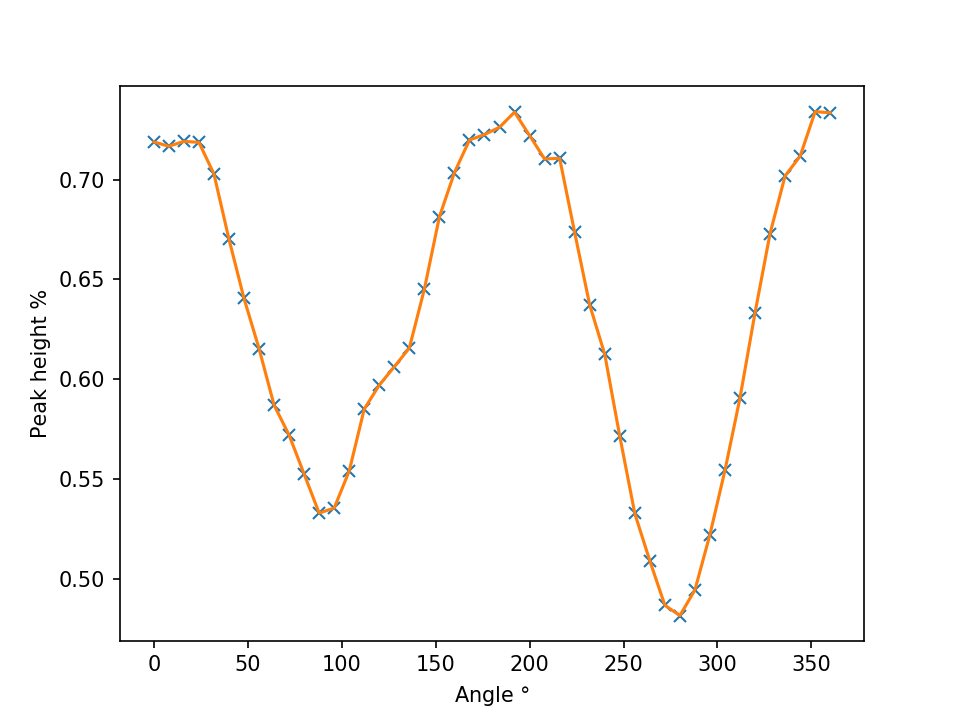

In [124]:
%matplotlib notebook
texture = loadtxt('texture1_1.txt')
x = []
y = []
f = open('texture1_1.txt')
for line in f:
    s = line.split()
    x.append(float(s[0]))
    y.append(float(s[3]))
f.close()
x = np.array(x)
y = np.array(y)
plt.plot(x, y, 'x')
plt.plot(x, y, '-')
plt.ylabel("Peak height %")
plt.xlabel("Angle $\degree$")
plt.show()
plt.savefig("The height of 2.53 peak_2.png")

<IPython.core.display.Javascript object>


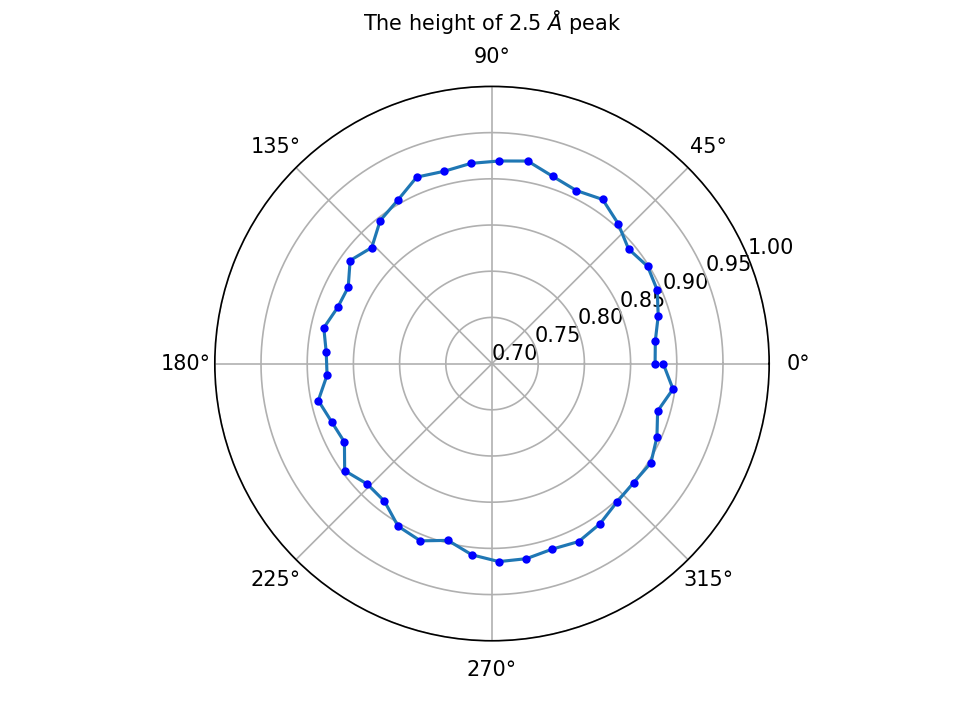

In [133]:
texture = loadtxt('texture1_1_roi.txt')
x = []
y = []
ft = open('texture1_1_roi.txt')
for line in ft:
    s = line.split()
    x.append(float(s[0]))
    y.append(float(s[3]))
ft.close()

x = np.array(x)
y = np.array(y)
theta = np.radians(x)
fig1 = plt.figure()
plt.polar(theta,y,'-')
plt.polar(theta,y,'b.')
plt.ylim(0.7,1)
# plt.ylim(0.4,0.8)
plt.title( "The height of 2.5 $\AA$ peak" , size=10, y=1.08)
plt.savefig("The height of 2.53 peak_1_roi.png")


In [ ]:
# for stress 4
%matplotlib notebook
open('testure_4.txt', "w").close() # clears anything written in the file
f = open('testure_4.txt','ab')
for i in range(0, len(myfiles4)):
# for i in range(0, 3):
    if (i != 33) :        
        spectrum_sample1 = np.zeros(len(coll_files1))
        pathdata1= rootdir1+ myfiles1[i]+"/"
        coll_files1=sorted(fnmatch.filter(listdir(pathdata1),'*.fits'))
        for j in range(0, len(coll_files1)):
            with fits.open(pathdata1+coll_files1[j]) as im:
                data=im[0].data[roi_1[1]:roi_1[3],roi_1[0]:roi_1[2]].astype(float)
                spectrum_sample[j]=np.sum(data[~np.isnan(data) & ~np.isinf(data)])
            with fits.open(pathOB+coll_files_OB[j]) as im_ob:
                ob=im_ob[0].data[roi_1[1]:roi_1[3],roi_1[0]:roi_1[2]].astype(float)
                spectrum_OB[j]=np.sum(ob[~np.isnan(ob) & ~np.isinf(ob)])
        spectrum_norm1=(spectrum_sample1/spectrum_OB)
        mylambda_peaks1 = mylambda1[208:300]
        spectrum_norm_peaks1=spectrum_norm1[208:300]
        np.savetxt('spectrum_norm',np.vstack((mylambda_peaks1, spectrum_norm_peaks1)).T,fmt= ('%2.5f'),delimiter = '\t')
        peaks2, _ = find_peaks(spectrum_norm_peaks1,width = 5)
        plt.plot(mylambda_peaks1, spectrum_norm_peaks1,'-')
        plt.plot(mylambda_peaks1[peaks2],spectrum_norm_peaks1[peaks2],'k*')
        plt.xlabel('wavelength ($\AA$)')
        plt.ylabel('Transmission (%)')
        print(peaks2)
        print(mylambda_peaks[peaks2])
        print(spectrum_norm_peaks[peaks2])
        if (i < 33) :
            np.savetxt(f,np.vstack((i*8,i+13,mylambda_peaks1[peaks2], spectrum_norm_peaks1[peaks2])).T,fmt= ('%2.7f'),delimiter = '\t')
        else:
            np.savetxt(f,np.vstack(((i-1)*8,i+13,mylambda_peaks1[peaks2], spectrum_norm_peaks1[peaks2])).T,fmt= ('%2.7f'),delimiter = '\t')
    else:
        i=i+1
f.close()
plt.savefig ("texture-2_2.5A.png")
# plt.plot(i*8,spectrum_norm_peaks[peaks2],'-')        

<IPython.core.display.Javascript object>


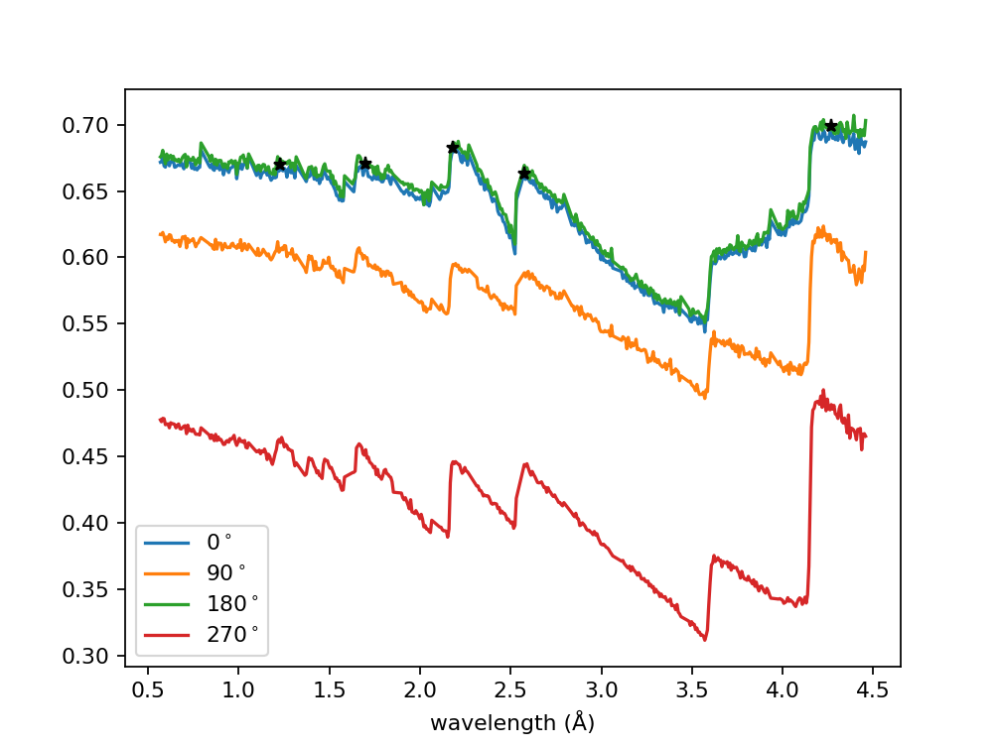

[ 81 135 191 235 447]
[0.66988123 0.67034866 0.68261137 0.66343945 0.69885034]
[1.22980365 1.70075359 2.18178686 2.57536677 4.26854933]


In [15]:
%matplotlib notebook
spectrum_sample1 = np.zeros(len(coll_files))
spectrum_sample2 = np.zeros(len(coll_files))
spectrum_sample3 = np.zeros(len(coll_files))
spectrum_sample4 = np.zeros(len(coll_files))
pathdata1= rootdir+ myfiles[0]+"/"
pathdata2= rootdir+ myfiles[11]+"/"
pathdata3= rootdir+ myfiles[23]+"/"
pathdata4= rootdir+ myfiles[35]+"/"
coll_files1=sorted(fnmatch.filter(listdir(pathdata1),'*.fits'))
coll_files2=sorted(fnmatch.filter(listdir(pathdata2),'*.fits'))
coll_files3=sorted(fnmatch.filter(listdir(pathdata3),'*.fits'))
coll_files4=sorted(fnmatch.filter(listdir(pathdata4),'*.fits'))
for j in range(0, len(coll_files)):
        with fits.open(pathdata1+coll_files1[j]) as im1:
            data=im1[0].data[roi[1]:roi[3],roi[0]:roi[2]].astype(float)
            spectrum_sample1[j]=np.sum(data[~np.isnan(data) & ~np.isinf(data)])
        with fits.open(pathdata2+coll_files2[j]) as im2:
            data=im2[0].data[roi[1]:roi[3],roi[0]:roi[2]].astype(float)
            spectrum_sample2[j]=np.sum(data[~np.isnan(data) & ~np.isinf(data)])
        with fits.open(pathdata3+coll_files3[j]) as im3:
            data=im3[0].data[roi[1]:roi[3],roi[0]:roi[2]].astype(float)
            spectrum_sample3[j]=np.sum(data[~np.isnan(data) & ~np.isinf(data)])
        with fits.open(pathdata4+coll_files4[j]) as im4:
            data=im4[0].data[roi[1]:roi[3],roi[0]:roi[2]].astype(float)
            spectrum_sample4[j]=np.sum(data[~np.isnan(data) & ~np.isinf(data)])
        with fits.open(pathOB+coll_files_OB[j]) as im_ob:
            ob=im_ob[0].data[roi[1]:roi[3],roi[0]:roi[2]].astype(float)
            spectrum_OB[j]=np.sum(ob[~np.isnan(ob) & ~np.isinf(ob)])
spectrum_norm1=(spectrum_sample1/spectrum_OB)  
spectrum_norm2=(spectrum_sample2/spectrum_OB) 
spectrum_norm3=(spectrum_sample3/spectrum_OB)  
spectrum_norm4=(spectrum_sample4/spectrum_OB) 
plt.plot(mylambda, spectrum_norm1,'-')
plt.plot(mylambda, spectrum_norm2,'-')
plt.plot(mylambda, spectrum_norm3,'-')
plt.plot(mylambda, spectrum_norm4,'-')
# plt.xlim([2,4.4])
plt.legend( ['0$^\circ$','90$^\circ$','180$^\circ$','270$^\circ$'], loc='lower left')

# print(spectrum_norm1)
# indexes = detect_peaks(spectrum_norm1, mph=0.4, mpd=0.1)
# indexes = peakutils.indexes(spectrum_norm1, thres=0.65, min_dist=0.2)
plt.xlabel('wavelength (\u212B)')
peaks2, _ = find_peaks(spectrum_norm1, width = 5)
plt.plot(mylambda[peaks2],spectrum_norm1[peaks2],'k*')
print(peaks2)
print(spectrum_norm1[peaks2])
print(mylambda[peaks2])
# indexes = detect_peaks(cb, mph=0.04, mpd=100)
# plt.savefig ("texture-4.png")

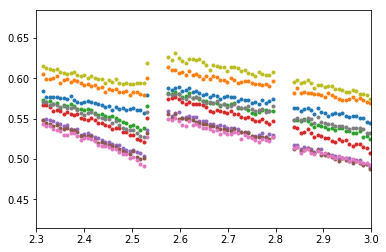

In [53]:
# for i in range(0, len(myfiles)):
for i in range(0, 20):
    spectrum_sample = np.zeros(len(coll_files))
    pathdata= rootdir+ myfiles[i]+"/"
    coll_files=sorted(fnmatch.filter(listdir(pathdata),'*.fits'))
    for j in range(0, len(coll_files)):
        with fits.open(pathdata+coll_files[j]) as im:
            data=im[0].data[roi[1]:roi[3],roi[0]:roi[2]].astype(float)
            spectrum_sample[j]=np.sum(data[~np.isnan(data) & ~np.isinf(data)])
        with fits.open(pathOB+coll_files_OB[j]) as im_ob:
            ob=im_ob[0].data[roi[1]:roi[3],roi[0]:roi[2]].astype(float)
            spectrum_OB[j]=np.sum(ob[~np.isnan(ob) & ~np.isinf(ob)])
    spectrum_norm=(spectrum_sample/spectrum_OB)    
    plt.plot(mylambda, spectrum_norm,'.')
    plt.xlim([2.3,3])
#     plt.legend()
    

<IPython.core.display.Javascript object>


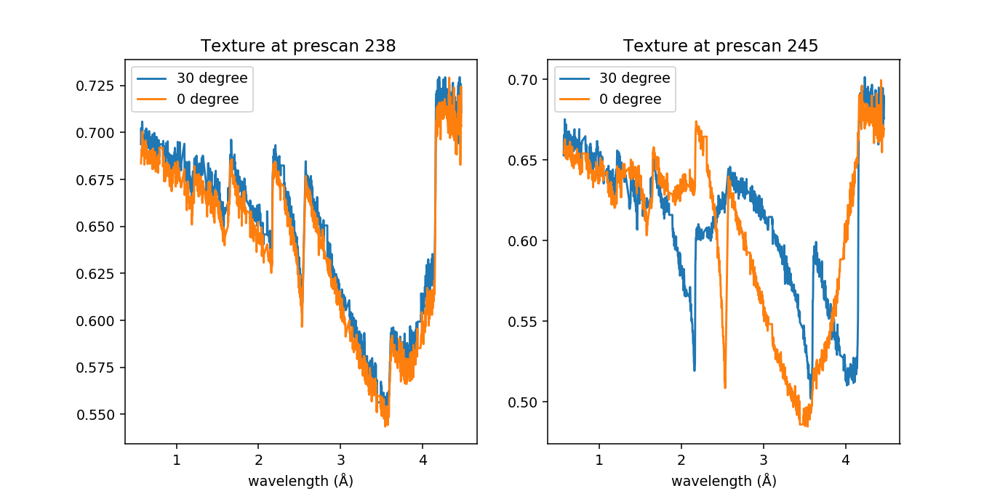

Text(0.5, 1.0, 'Texture at prescan 245 ')

In [81]:
fig,ax =plt.subplots(figsize=(10, 5))
plt.subplot(1,2, 1)
plt.plot(mylambda, filtered_norm2,'-')
plt.plot(mylambda, filtered_norm1,'-')

plt.xlabel('wavelength (\u212B)')
# plt.xlim([2.2,4.2])
plt.legend(['30 degree', '0 degree'], loc='upper left')
plt.title('Texture at prescan 238 ')

plt.subplot(1,2, 2)
plt.plot(mylambda, filtered_norm4,'-')
plt.plot(mylambda, filtered_norm3,'-')
plt.xlabel('wavelength (\u212B)')
# plt.xlim([2.2,4.2])
plt.legend(['30 degree', '0 degree'], loc='upper left')
plt.title('Texture at prescan 245 ')
# plt.show()